# **Simulación de Tasas** - *Abril 2022*

In [183]:
# Libraries
import pandas as pd
import numpy as np
import datetime 
import matplotlib.pyplot as plt
from dateutil.relativedelta import relativedelta
import matplotlib as mlp
import seaborn as sns
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
import os
import datatable as dt
from statsmodels.tsa.api import VAR
from pandas_datareader.fred import FredReader as fred

# import pmdarima as pm
%load_ext autoreload
%autoreload 2
import rate_simulation as stc

mlp.style.use('seaborn-notebook')
sns.set(font_scale=1.2)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
from plotly import express as px
import plotly.graph_objects as go
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [4]:
template = input("Escriba el tema del cuaderno (light/dark):")
assert template in ('light', 'dark'), 'Tema no valido'
if template == 'light':
    template = 'plotly'
else:
    template = 'plotly_dark'

Escriba el tema del cuaderno (light/dark): dark


In [5]:
layout_dict = dict(
    height = 550,
    template = template,
    title = {
        'text':"",
        'font': {
            'family': 'Helvetica'
        }
    },
    yaxis = {
        'title': 'Tasa (%)'
    }

)

In [6]:
full_rates = pd.read_csv(
    '..\\series\\historico_tasas_python.csv', 
    index_col = 0, parse_dates=['Fecha']).set_index('Fecha', drop=True)
fecha_corte = (
    datetime.date.today() - relativedelta(days=datetime.date.today().day)
)
fecha_corte = datetime.datetime.combine(fecha_corte, datetime.datetime.min.time())
monthly_rates = full_rates.groupby(pd.Grouper(freq='M')).last()
monthly_ipc = monthly_rates['IPC Anual']
monthly_rates['IPC Anual'] = monthly_rates['IPC Anual'].shift(-1)
monthly_rates = monthly_rates.loc[:datetime.date.today(), :]
monthly_rates.tail()

,TIBR,IBR Overnight,IBR 1M,IBR 3M,IBR 6M,DTF,IPC Anual,IPC Mensual,FED,UVR,...,IBC,USURA,TRM,DEV. TRM,LIBOR,SOFR,LEMPIRA/USD,DEV. LEMPIRA,COLON/USD,DEV. COLON
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-30,0.025,0.02473,0.02604,0.03014,0.03505,0.0277,0.0526,0.0001,0.0025,287.8627,...,0.1727,0.25905,4010.98,0.110632,0.002432,0.0005,24.2924,-0.003810,632.20,0.038453
2021-12-31,0.030,0.02905,0.02966,0.03418,0.04086,0.0321,0.0562,0.0050,0.0025,288.6191,...,0.1746,0.26190,3981.16,0.159843,0.003387,0.0005,24.5158,0.009591,645.25,0.045278
2022-01-31,0.040,0.03875,0.03878,0.04244,0.05161,0.0354,0.0694,0.0073,0.0025,290.4047,...,0.1766,0.26490,3982.60,0.118878,0.005440,0.0005,24.6505,0.016256,646.20,0.048754
2022-02-28,0.040,0.03869,0.03976,0.05085,0.06345,0.0440,0.0801,0.0167,0.0025,293.6781,...,0.1830,0.27450,3910.64,0.078979,0.008047,0.0005,24.6680,0.017350,647.34,0.051150
2022-03-31,0.040,0.03877,0.05261,0.06116,0.07401,0.0515,0.0853,0.0163,0.0050,298.7784,...,0.1847,0.27705,3748.15,0.003008,0.014699,0.0029,24.5110,0.013031,667.10,0.083289


# **1. Tasa de Intervención del Banco de la República (*TIBR*)**

In [7]:
tibr_m = monthly_rates.loc['2008-01-01':, 'TIBR']
tibr = stc.PoissonRateSeries(tibr_m, p=4 , q=4, i=0, ref_date='2008-01-01', 
                                Np=1000)

C:\Users\PERSONAL\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



https://analyticsindiamag.com/complete-guide-to-dickey-fuller-test-in-time-series-analysis/

In [8]:
p_value = adfuller(tibr.jump_series.values)[1]
if p_value <= 0.05:
    print(f"No se encuentra evidencia de raís unitaria.\n" 
          f"Se concluye serie estacionaria. p-value = {p_value: .4%}")

No se encuentra evidencia de raís unitaria.
Se concluye serie estacionaria. p-value =  0.0002%


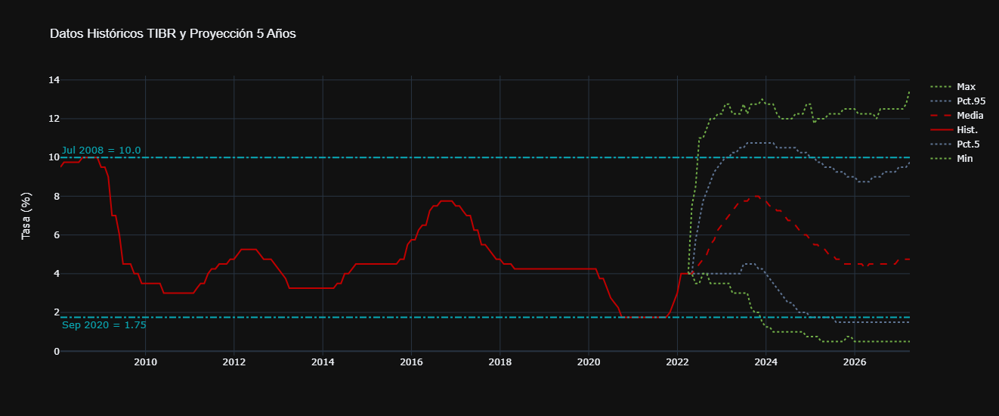

In [9]:
layout_dict['title']['text'] = "Datos Históricos TIBR y Proyección 5 Años"
tibr.plot_hist_forecast(**layout_dict)

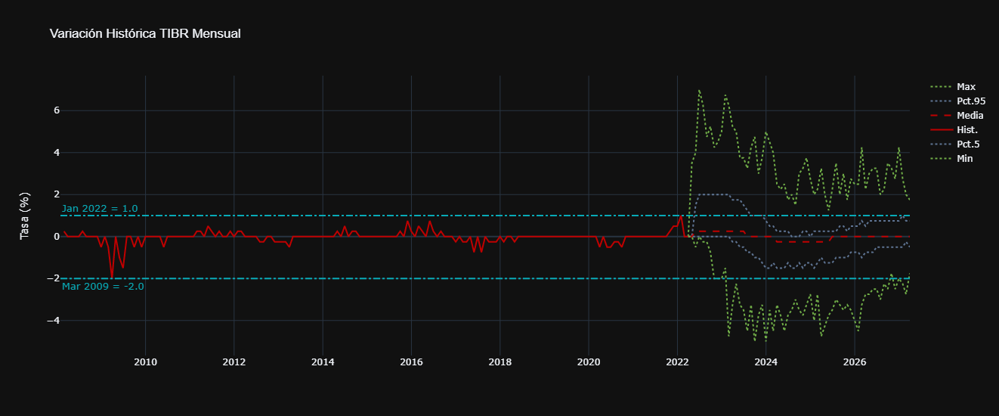

In [10]:
layout_dict['title']['text'] = "Variación Histórica TIBR Mensual"
tibr.plot_variations(**layout_dict)

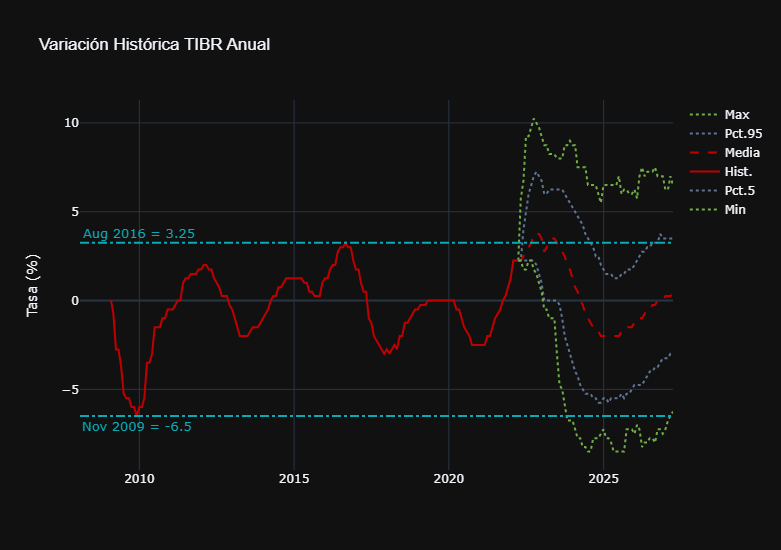

In [11]:
layout_dict['title']['text'] = "Variación Histórica TIBR Anual"
tibr.plot_variations(delta_t=12, **layout_dict)

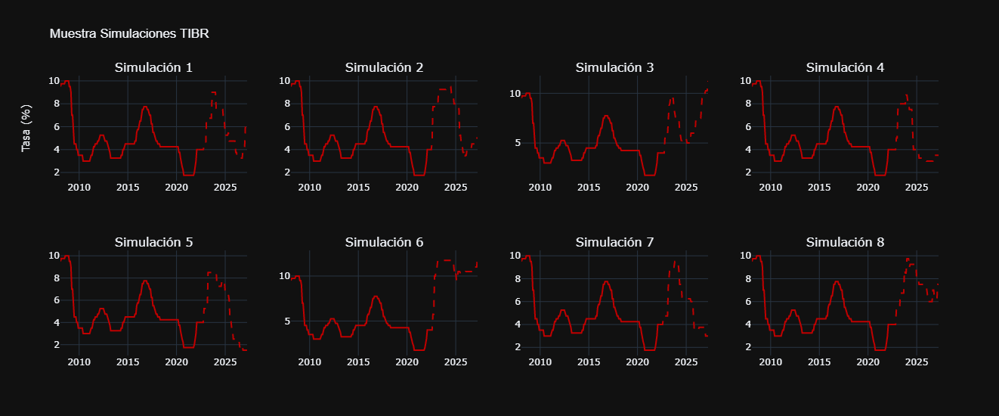

In [12]:
layout_dict['title']['text'] = "Muestra Simulaciones TIBR"
tibr.plot_simulations(**layout_dict)

# **Tasas IBR**

## *IBR Overnight*

In [13]:
ibron = stc.RandomVariationSeriesSimulation(
    series = monthly_rates['IBR Overnight'],
    mc_reference_df = tibr.simulated_df,
    reference_rate_series = monthly_rates['TIBR']
)

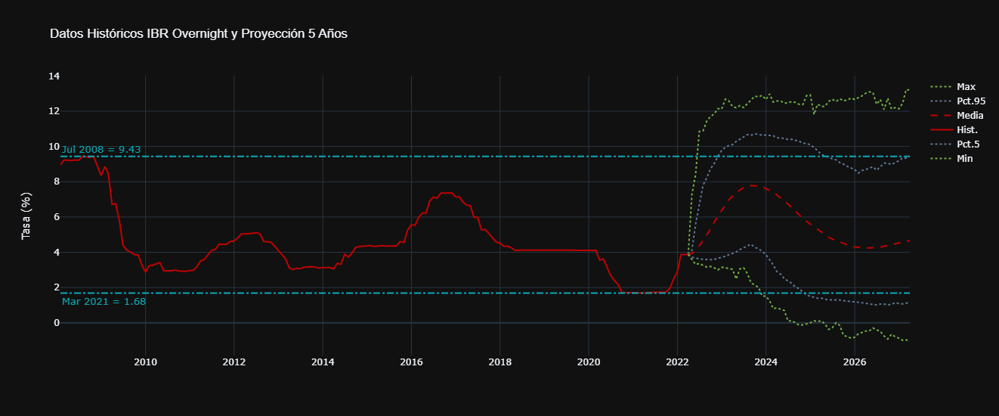

In [14]:
layout_dict['title']['text'] = "Datos Históricos IBR Overnight y Proyección 5 Años"
ibron.plot_hist_forecast(**layout_dict)

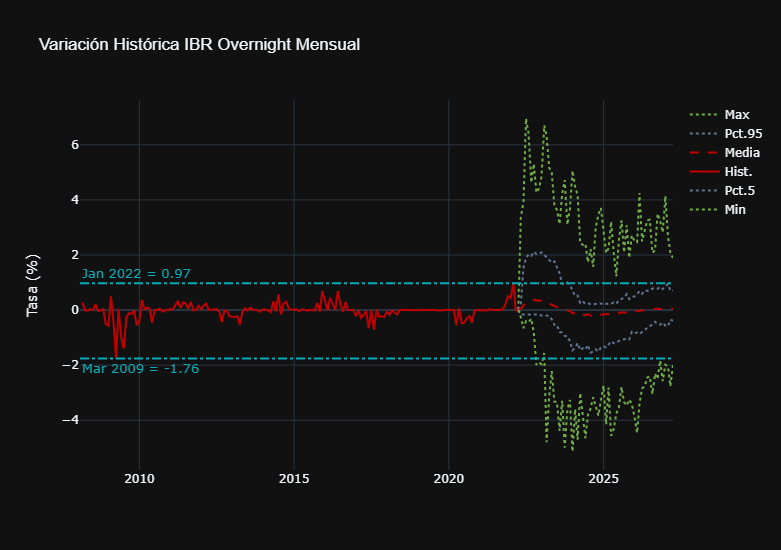

In [15]:
layout_dict['title']['text'] = "Variación Histórica IBR Overnight Mensual"
ibron.plot_variations(**layout_dict)

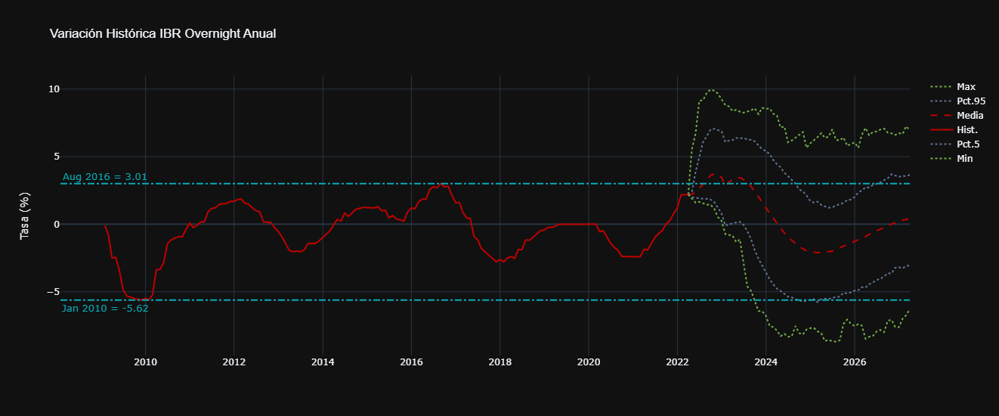

In [16]:
layout_dict['title']['text'] = "Variación Histórica IBR Overnight Anual"
ibron.plot_variations(delta_t=12, **layout_dict)

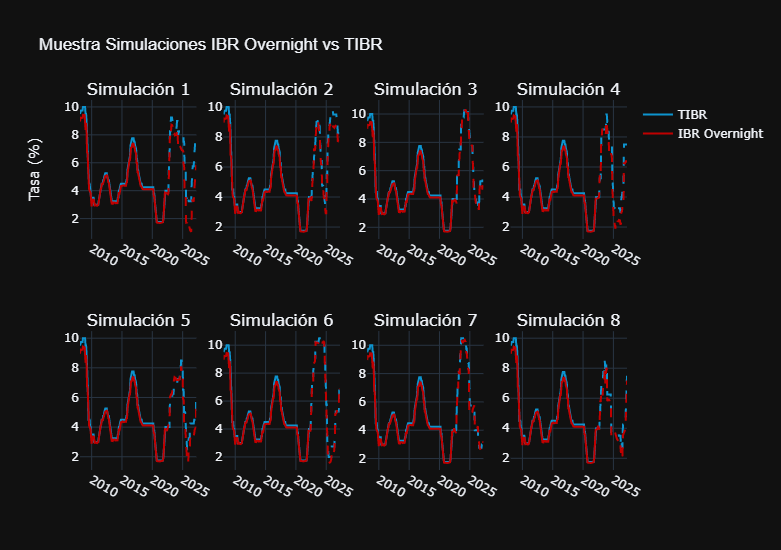

In [17]:
layout_dict['title']['text'] = "Muestra Simulaciones IBR Overnight vs TIBR"
ibron.plot_simulations(**layout_dict)

## *IBR 1M*

In [18]:
ibr1m = stc.RandomVariationSeriesSimulation(
    series = monthly_rates['IBR 1M'],
    mc_reference_df = tibr.simulated_df,
    reference_rate_series = monthly_rates['TIBR']
)

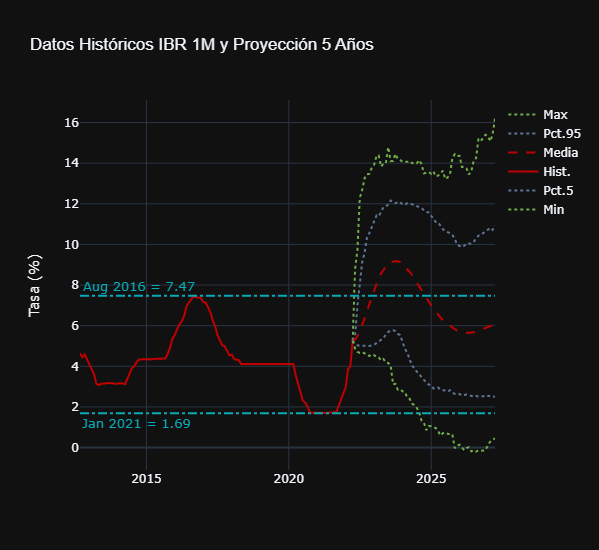

In [19]:
layout_dict['title']['text'] = "Datos Históricos IBR 1M y Proyección 5 Años"
ibr1m.plot_hist_forecast(**layout_dict)

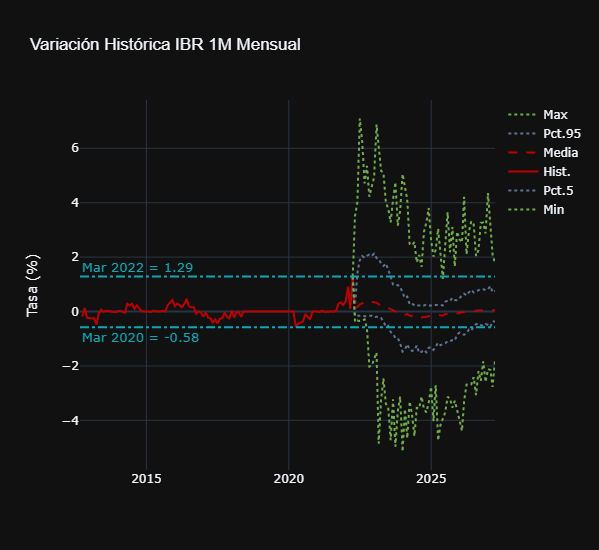

In [20]:
layout_dict['title']['text'] = "Variación Histórica IBR 1M Mensual"
ibr1m.plot_variations(**layout_dict)

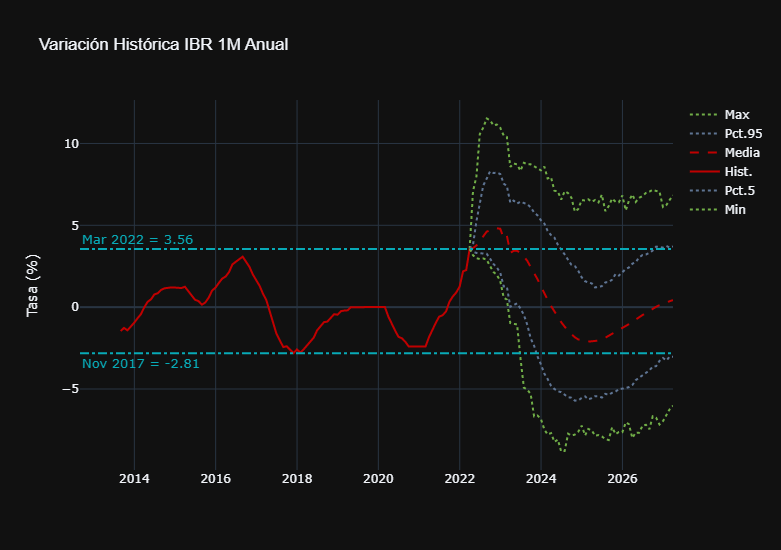

In [21]:
layout_dict['title']['text'] = "Variación Histórica IBR 1M Anual"
ibr1m.plot_variations(delta_t=12, **layout_dict)

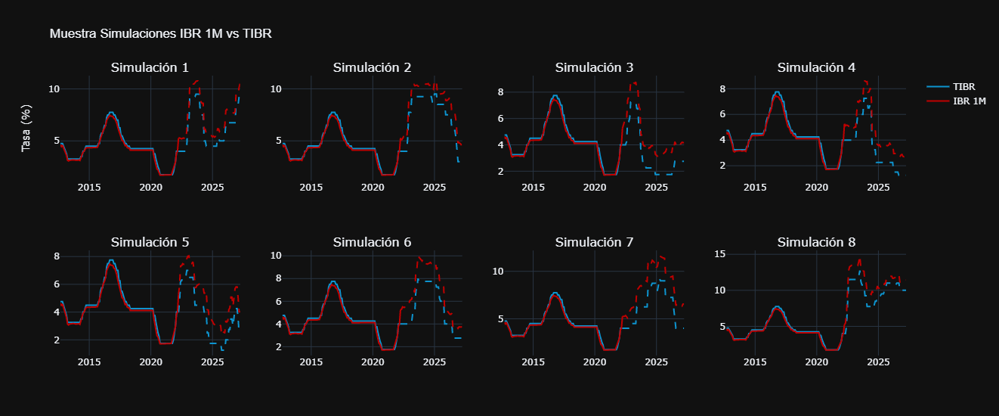

In [22]:
layout_dict['title']['text'] = "Muestra Simulaciones IBR 1M vs TIBR"
ibr1m.plot_simulations(**layout_dict)

## *IBR 3M*

In [23]:
ibr3m = stc.RandomVariationSeriesSimulation(
    series = monthly_rates['IBR 3M'],
    mc_reference_df = tibr.simulated_df,
    reference_rate_series = monthly_rates['TIBR']
)

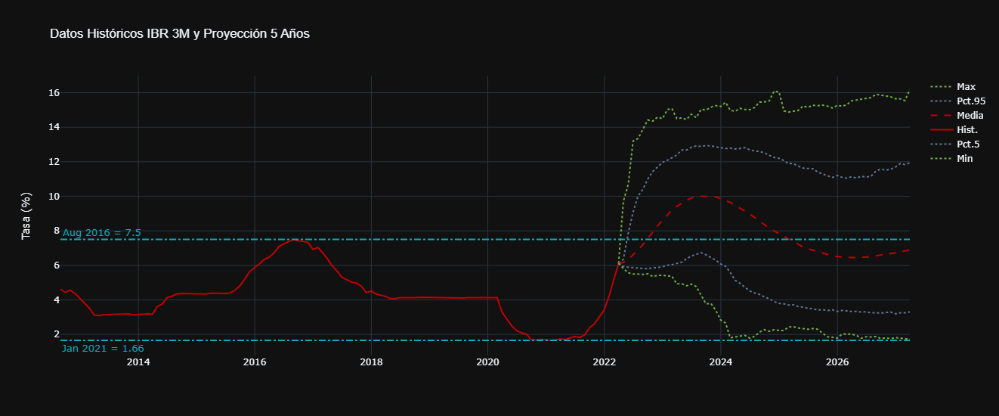

In [24]:
layout_dict['title']['text'] = "Datos Históricos IBR 3M y Proyección 5 Años"
ibr3m.plot_hist_forecast(**layout_dict)

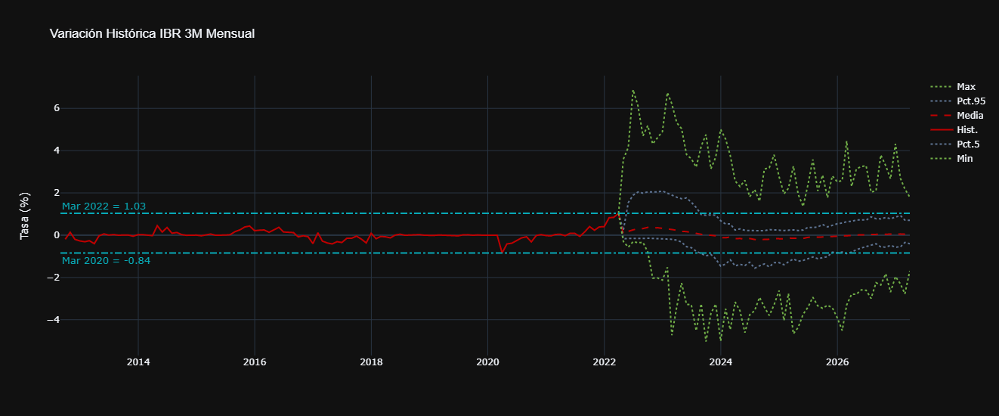

In [25]:
layout_dict['title']['text'] = "Variación Histórica IBR 3M Mensual"
ibr3m.plot_variations(**layout_dict)

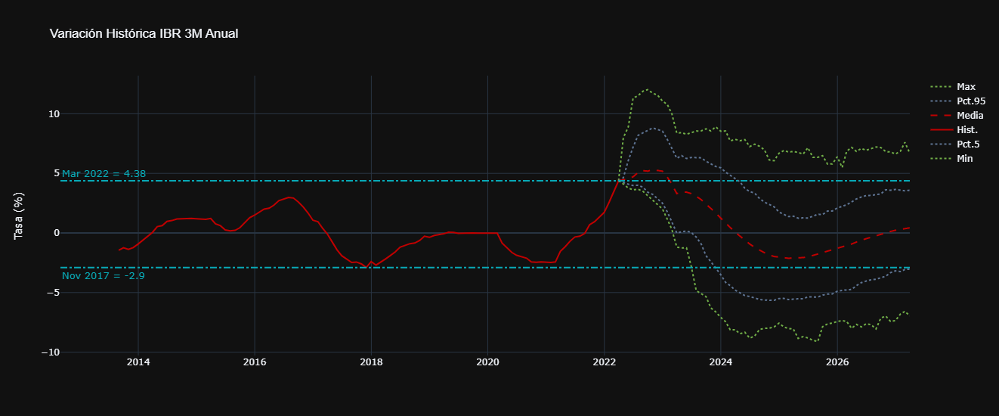

In [26]:
layout_dict['title']['text'] = "Variación Histórica IBR 3M Anual"
ibr3m.plot_variations(delta_t=12, **layout_dict)

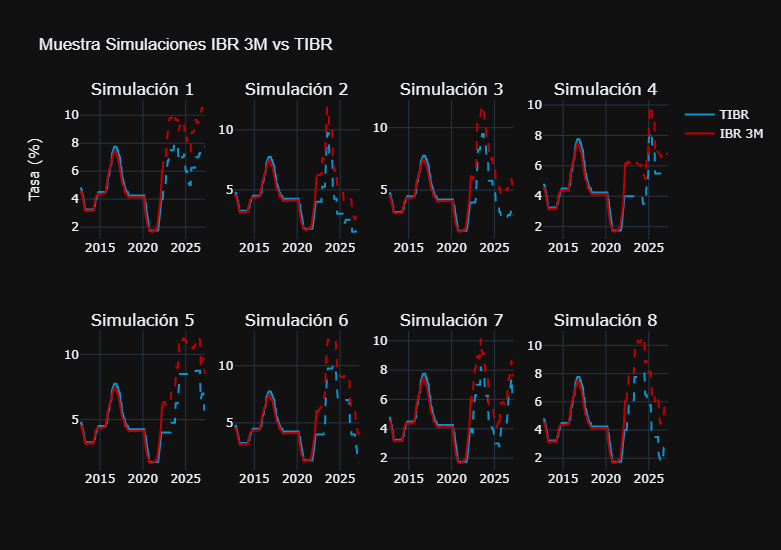

In [27]:
layout_dict['title']['text'] = "Muestra Simulaciones IBR 3M vs TIBR"
ibr3m.plot_simulations(**layout_dict)

## *IBR 6M*

In [28]:
ibr6m = stc.RandomVariationSeriesSimulation(
    series = monthly_rates['IBR 6M'],
    mc_reference_df = tibr.simulated_df,
    reference_rate_series = monthly_rates['TIBR']
)

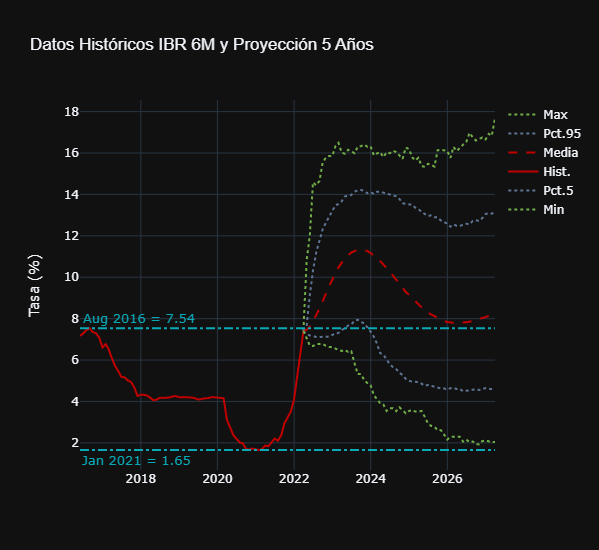

In [29]:
layout_dict['title']['text'] = "Datos Históricos IBR 6M y Proyección 5 Años"
ibr6m.plot_hist_forecast(**layout_dict)

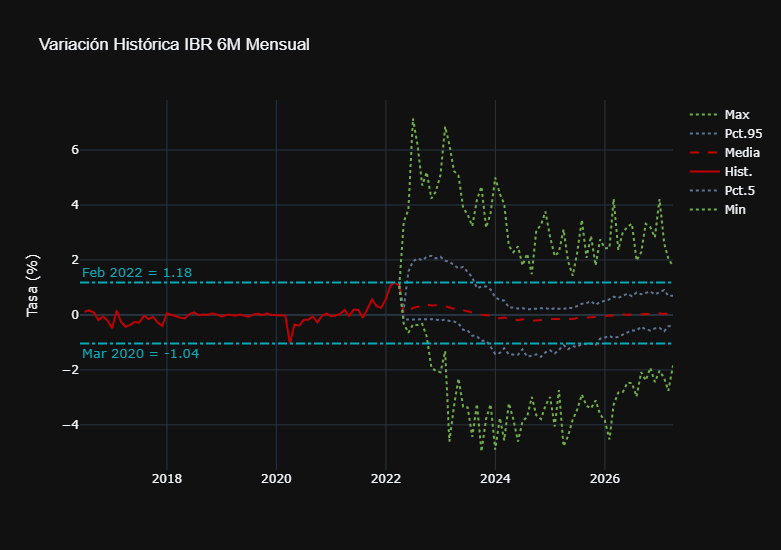

In [30]:
layout_dict['title']['text'] = "Variación Histórica IBR 6M Mensual"
ibr6m.plot_variations(**layout_dict)

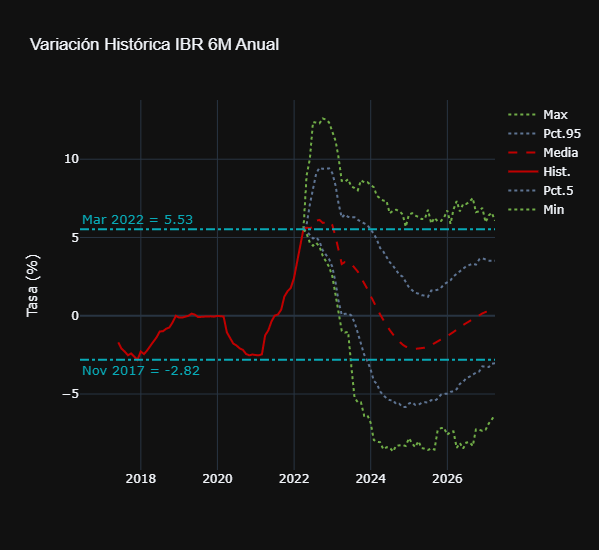

In [31]:
layout_dict['title']['text'] = "Variación Histórica IBR 6M Anual"
ibr6m.plot_variations(delta_t=12, **layout_dict)

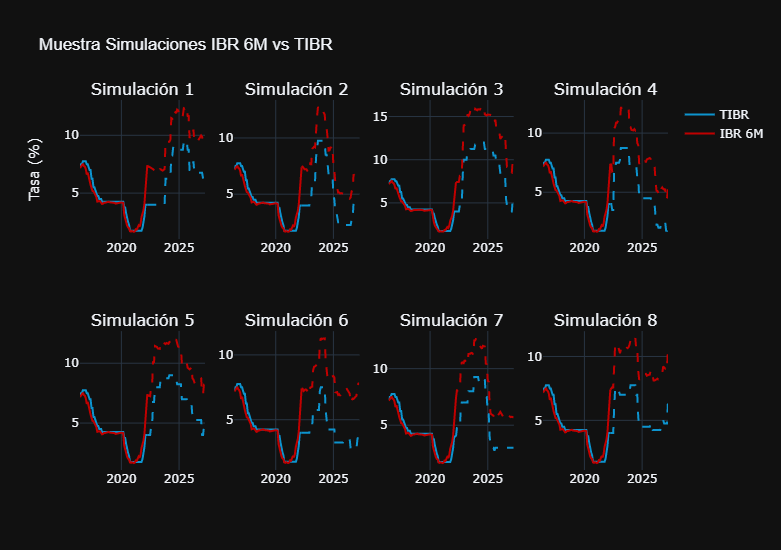

In [32]:
layout_dict['title']['text'] = "Muestra Simulaciones IBR 6M vs TIBR"
ibr6m.plot_simulations(**layout_dict)

# **Modelos VAR (*Vector Autoregressive*)**

## *DTF*

In [33]:
dtf = stc.VARModelSeries(
    df = monthly_rates.loc['2008':, ['TIBR', 'DTF']],
    predictive_forecast_df = tibr.full_df,
    target_name = 'DTF',
    transformation_parameters = (0.15, 0.15)
)

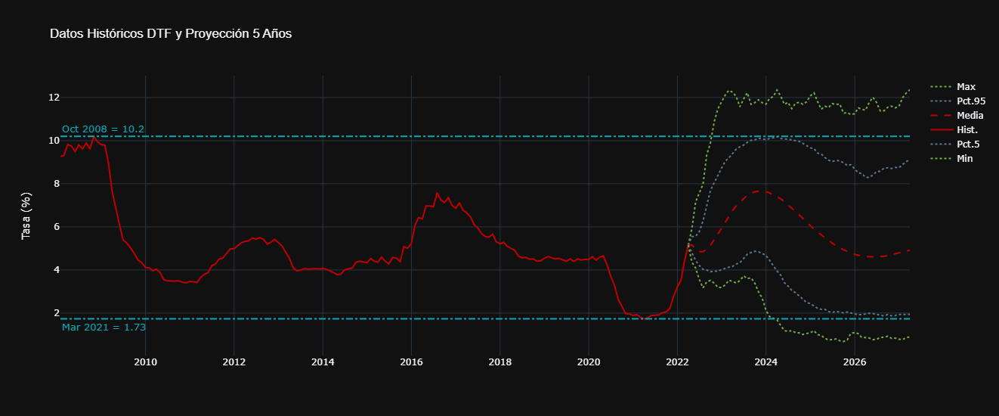

In [34]:
layout_dict['title']['text'] = "Datos Históricos DTF y Proyección 5 Años"
dtf.plot_hist_forecast(**layout_dict)

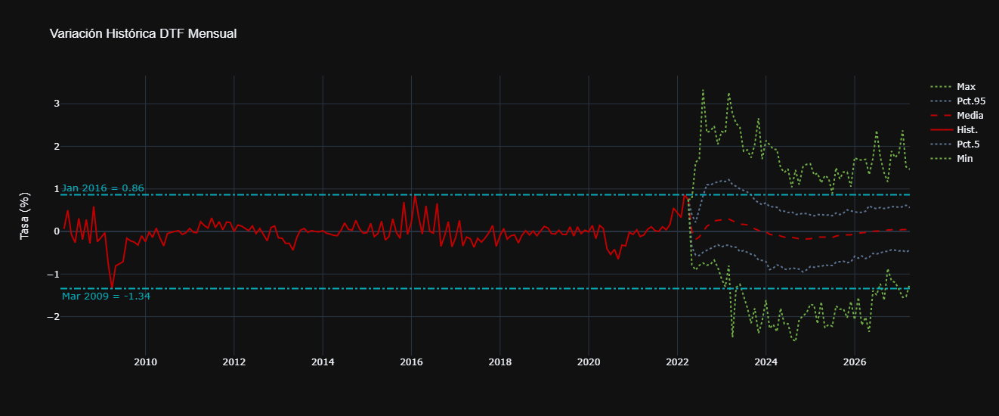

In [35]:
layout_dict['title']['text'] = "Variación Histórica DTF Mensual"
dtf.plot_variations(**layout_dict)

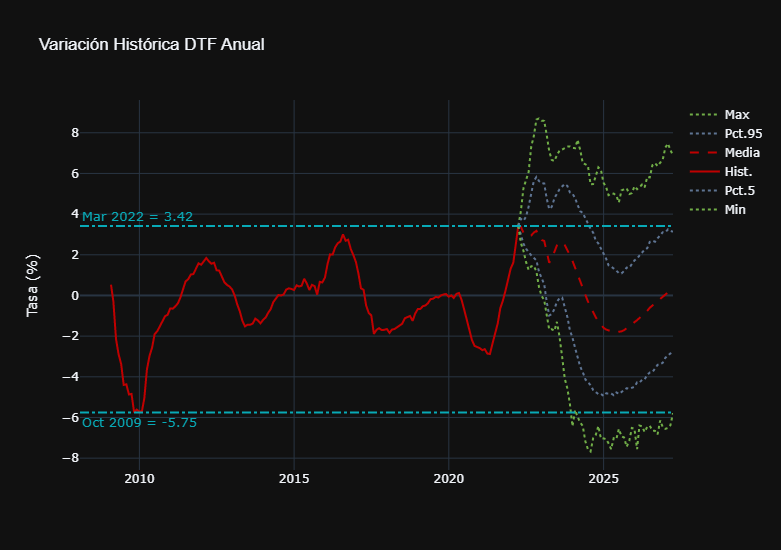

In [36]:
layout_dict['title']['text'] = "Variación Histórica DTF Anual"
dtf.plot_variations(delta_t=12, **layout_dict)

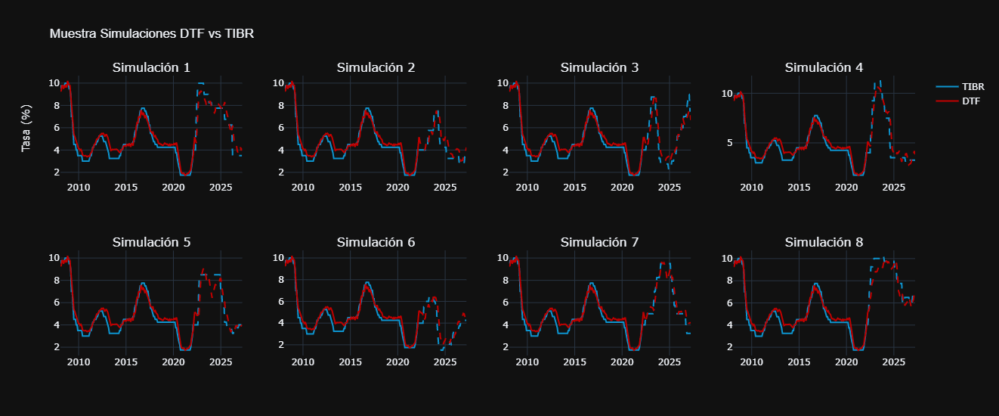

In [37]:
layout_dict['title']['text'] = "Muestra Simulaciones DTF vs TIBR"
dtf.plot_simulations(**layout_dict)

## *IPC*

In [38]:
ipc = stc.VARModelSeries(
    df = monthly_rates.loc['2008':, ['TIBR', 'IPC Anual']],
    predictive_forecast_df = tibr.full_df,
    target_name = 'IPC Anual',
    transformation_parameters = (0.15, 1)
)

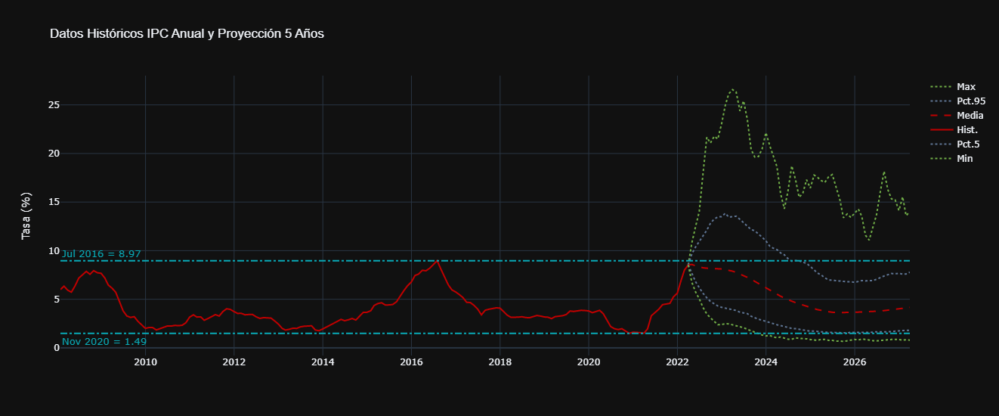

In [39]:
layout_dict['title']['text'] = "Datos Históricos IPC Anual y Proyección 5 Años"
ipc.plot_hist_forecast(**layout_dict)

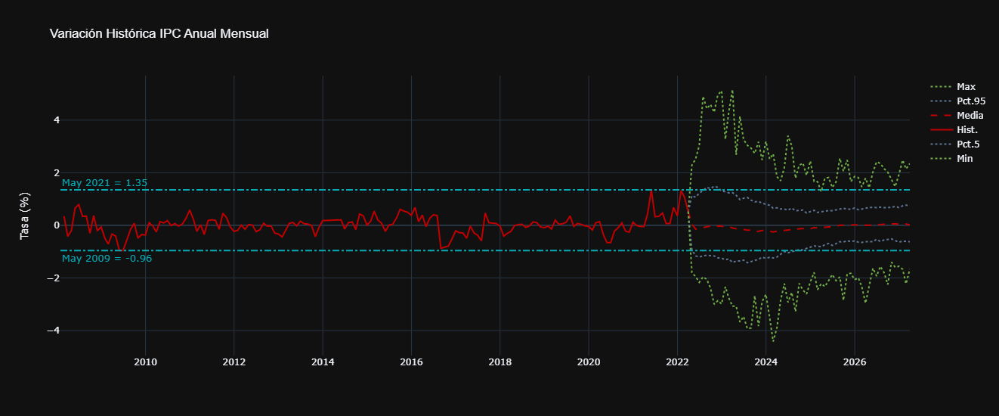

In [40]:
layout_dict['title']['text'] = "Variación Histórica IPC Anual Mensual"
ipc.plot_variations(**layout_dict)

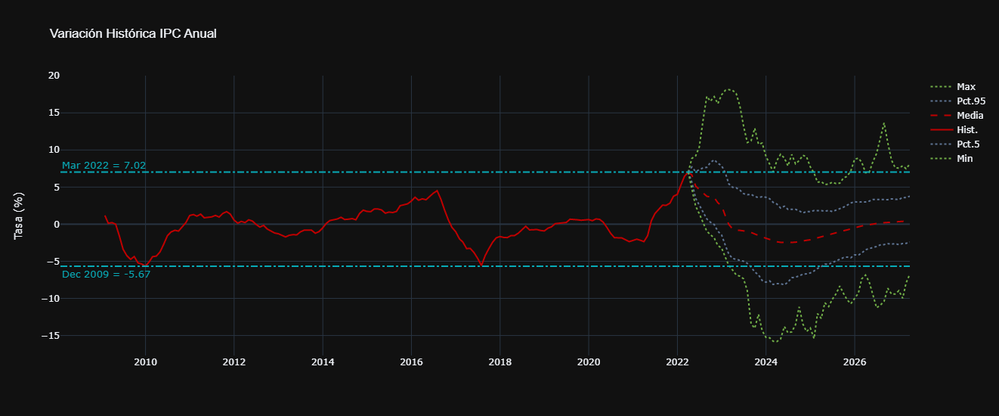

In [41]:
layout_dict['title']['text'] = "Variación Histórica IPC Anual"
ipc.plot_variations(delta_t=12, **layout_dict)

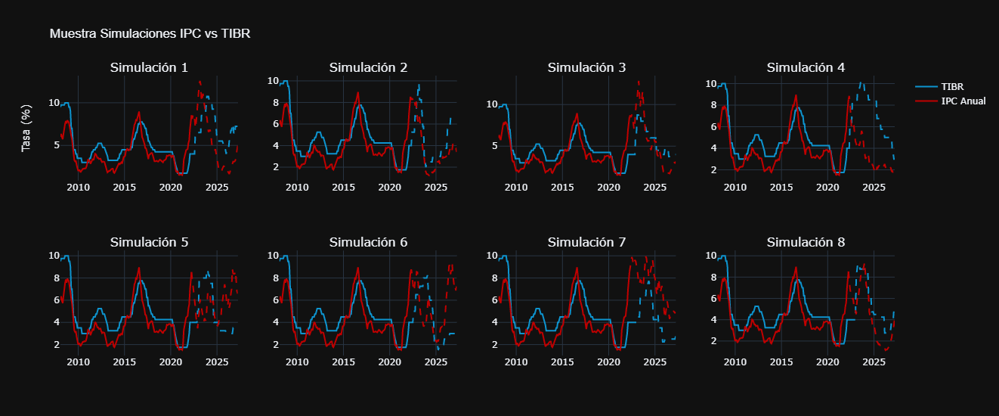

In [42]:
layout_dict['title']['text'] = "Muestra Simulaciones IPC vs TIBR"
ipc.plot_simulations(**layout_dict)

In [43]:
unidades_path = '../validation_series/ipc.csv'
index_series = pd.read_csv(unidades_path, 
                          parse_dates=['Fecha']).set_index('Fecha')
index_series = index_series.loc['2020':, 'Indice']
index_series = index_series.groupby(pd.Grouper(freq='M')).last().shift(-1)
index_series = index_series.dropna()
uvr = stc.UVRStochasticModel(
    uvr_series = full_rates.loc['2008-01-01':fecha_corte, 'UVR'],
    index_series = index_series, 
    mc_yearly_ipc = ipc.simulated_df, 
    ipc_series = monthly_rates.loc['2008':, 'IPC Anual'] * 100
)

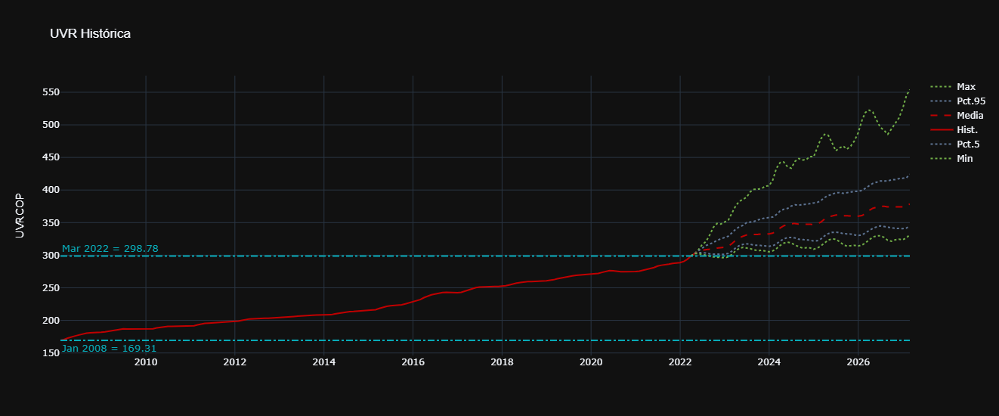

In [48]:
layout_dict['title']['text'] = "UVR Histórica"
layout_dict['yaxis']['title'] = 'UVRCOP'
uvr.plot_hist_forecast(**layout_dict)

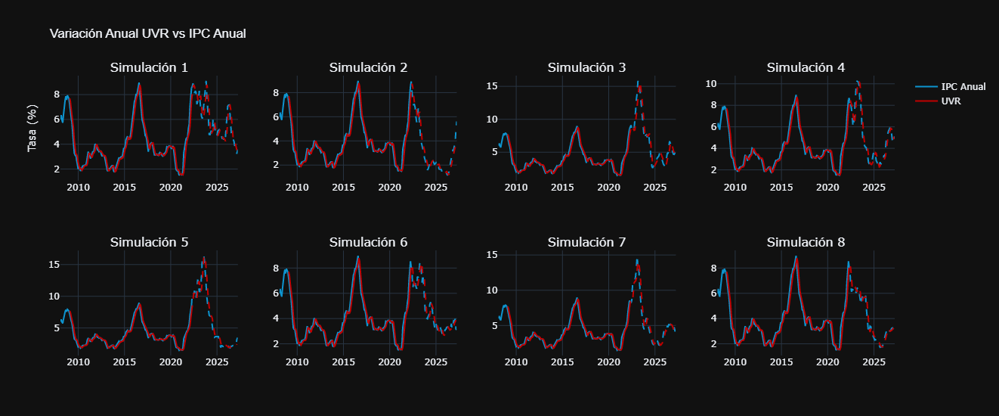

In [50]:
layout_dict['title']['text'] = 'Variación Anual UVR vs IPC Anual'
layout_dict['yaxis']['title'] = 'Tasa (%)'
uvr.plot_simulations(**layout_dict)


## *IBC*

In [51]:
ibc = stc.VARModelSeries(
    df = monthly_rates.loc['2008':, ['TIBR', 'IBC']],
    predictive_forecast_df = tibr.full_df,
    target_name = 'IBC',
    transformation_parameters = (0.15, 1),
    lags = range(1, 9)
)

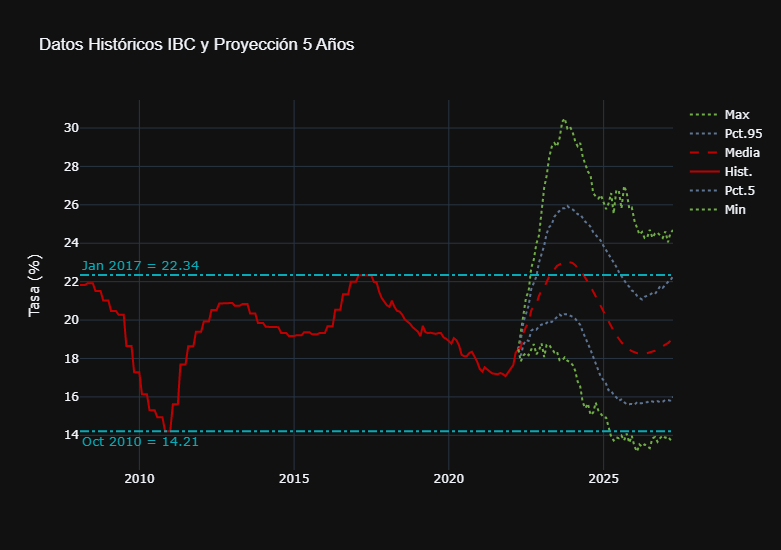

In [52]:
layout_dict['title']['text'] = "Datos Históricos IBC y Proyección 5 Años"
ibc.plot_hist_forecast(**layout_dict)

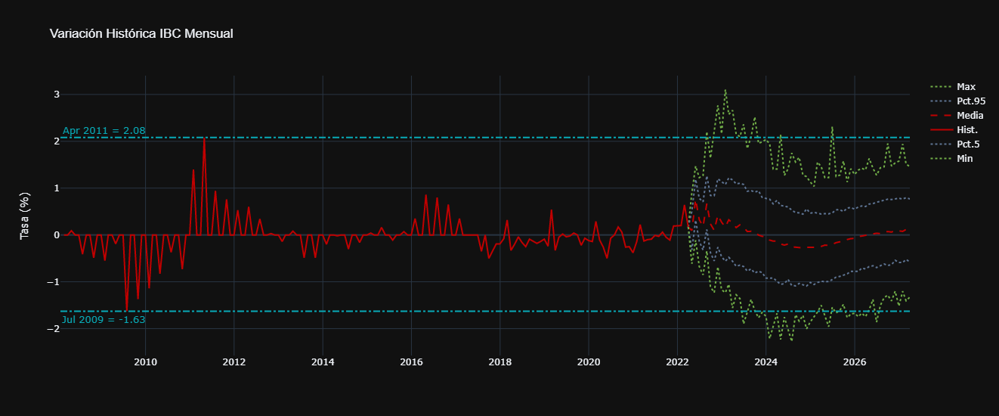

In [53]:
layout_dict['title']['text'] = "Variación Histórica IBC Mensual"
ibc.plot_variations(**layout_dict)

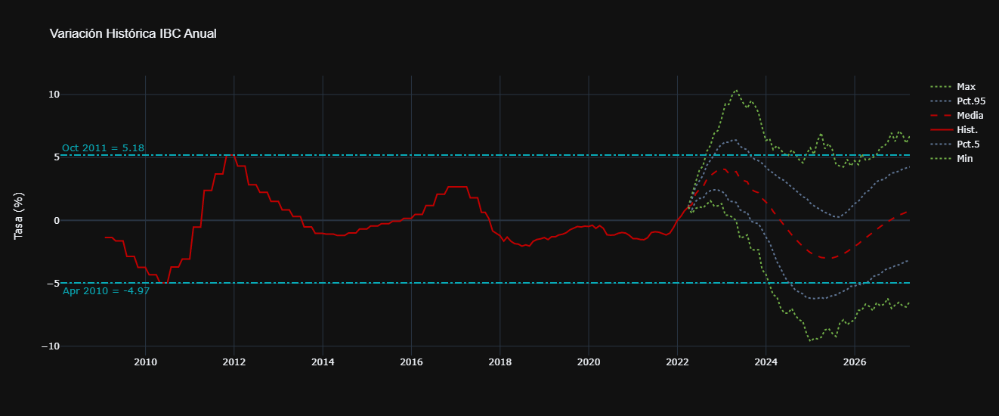

In [54]:
layout_dict['title']['text'] = "Variación Histórica IBC Anual"
ibc.plot_variations(delta_t=12, **layout_dict)

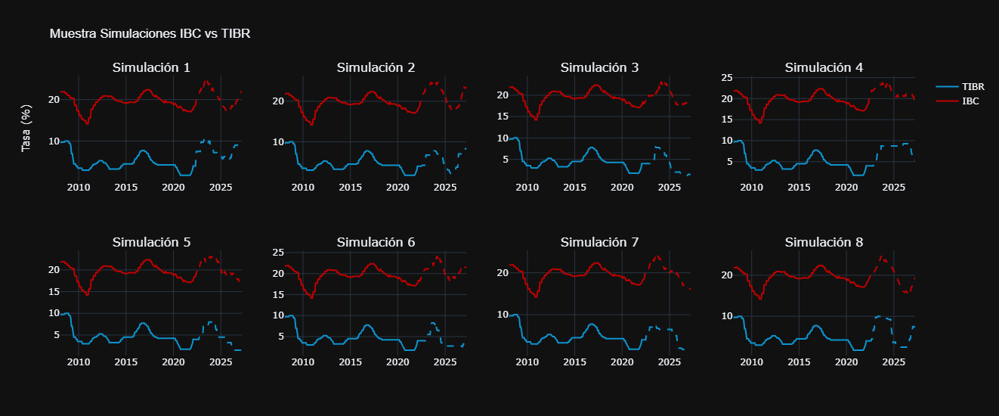

In [55]:
layout_dict['title']['text'] = "Muestra Simulaciones IBC vs TIBR"
ibc.plot_simulations(**layout_dict)

## *Usura*

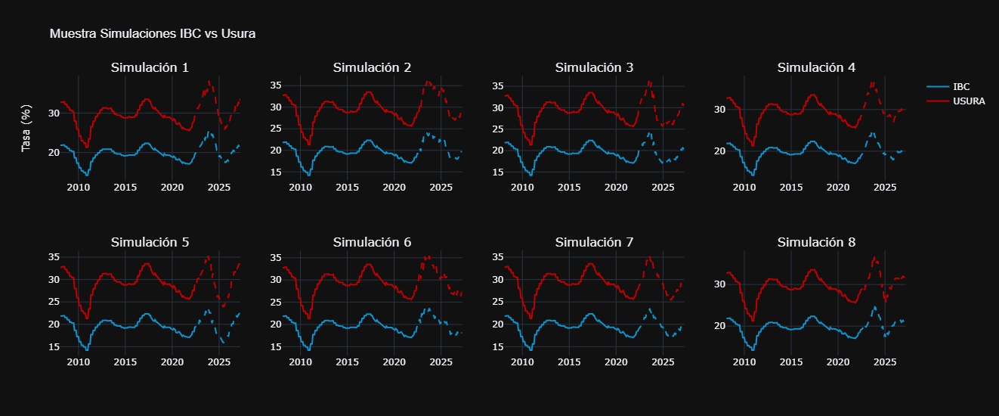

In [56]:
usura_sims = ibc.simulated_df*1.5
sims = np.random.randint(0, 999, 8)
layout_dict['title']['text'] = "Muestra Simulaciones IBC vs Usura"
stc.plot_simulations_with_pred_var(
    series = monthly_rates.loc['2008':, 'USURA']*100,
    pred_series = monthly_rates.loc['2008':, 'IBC']*100,
    sim_df = usura_sims.loc[:, sims],
    pred_sim_df = ibc.simulated_df.loc[:, sims],
    color_dict = ibc.COLORS,
    **layout_dict
)

# **Movimiento Browniano Geométrico (*GBM*)**

## *Tasa Representativa del Mercado (TRM)* 

In [58]:
trm = monthly_rates.loc['2000':, 'TRM']
trm_gbm = stc.GBMRateSeries(trm, Np=1000, Nt=60, T=60, upper_bound=9000)

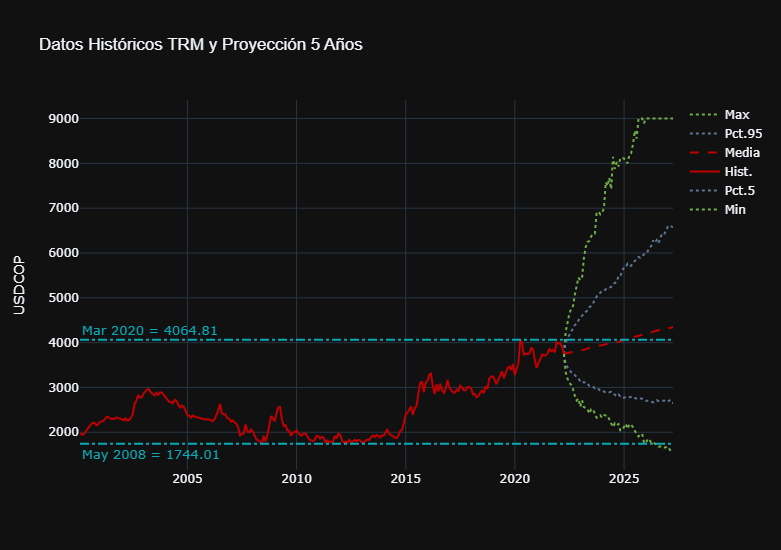

In [59]:
layout_dict['title']['text'] = "Datos Históricos TRM y Proyección 5 Años"
layout_dict['yaxis']['title'] = 'USDCOP'
trm_gbm.plot_hist_forecast(**layout_dict)

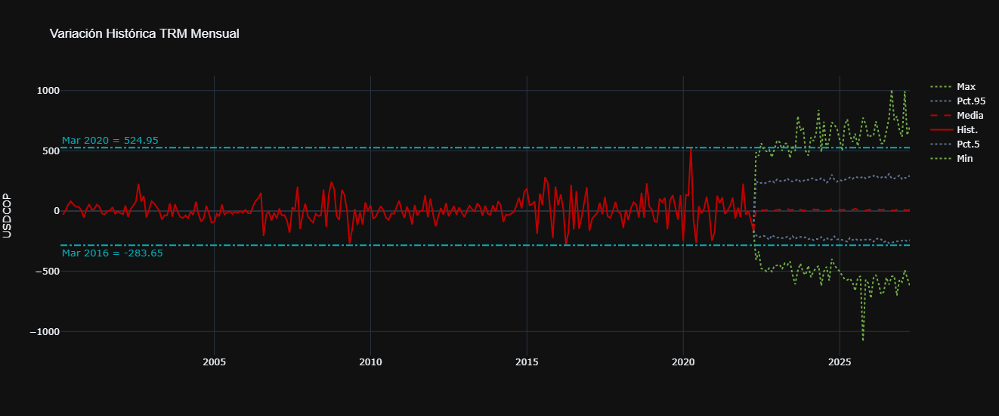

In [60]:
layout_dict['title']['text'] = "Variación Histórica TRM Mensual"
trm_gbm.plot_variations(**layout_dict)

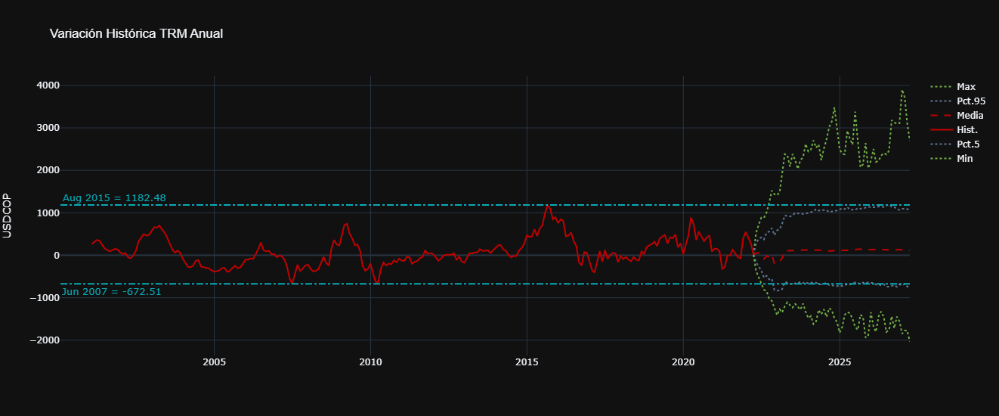

In [61]:
layout_dict['title']['text'] = "Variación Histórica TRM Anual"
trm_gbm.plot_variations(delta_t=12, **layout_dict)

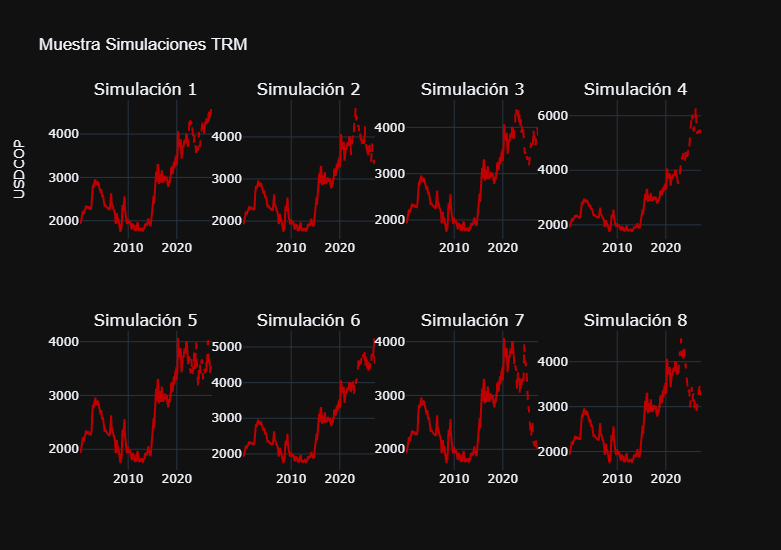

In [62]:
layout_dict['title']['text'] = "Muestra Simulaciones TRM"
trm_gbm.plot_simulations(**layout_dict)

## *Lempira (USDHNL)*

In [63]:
hnl_series = monthly_rates.loc['2000':, 'LEMPIRA/USD']
hnl_gbm = stc.GBMRateSeries(hnl_series, Np=1000, Nt=60, T=60)

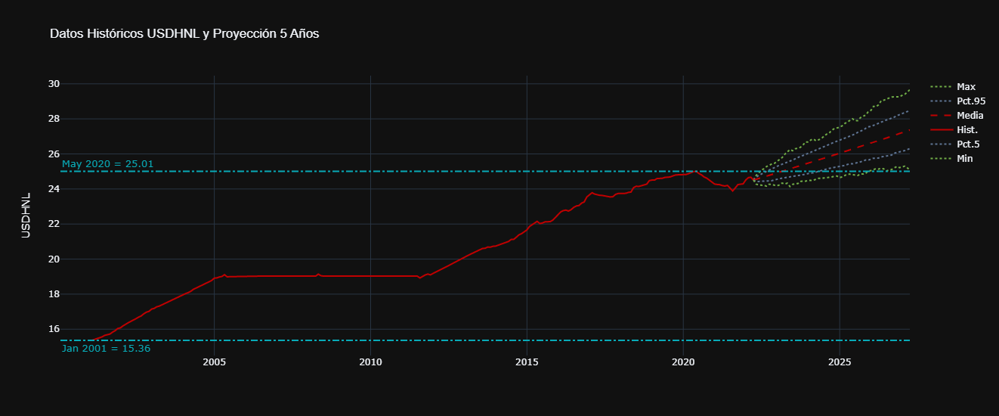

In [64]:
layout_dict['title']['text'] = "Datos Históricos USDHNL y Proyección 5 Años"
layout_dict['yaxis']['title'] = 'USDHNL'
hnl_gbm.plot_hist_forecast(**layout_dict)

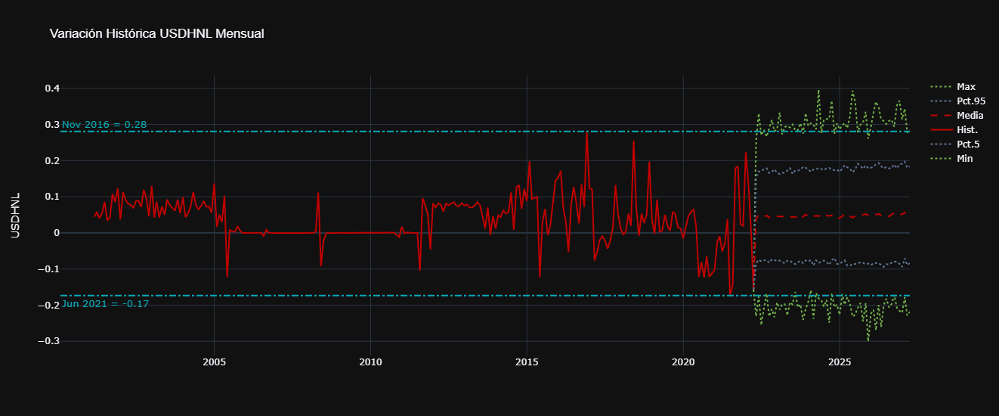

In [65]:
layout_dict['title']['text'] = "Variación Histórica USDHNL Mensual"
hnl_gbm.plot_variations(**layout_dict)

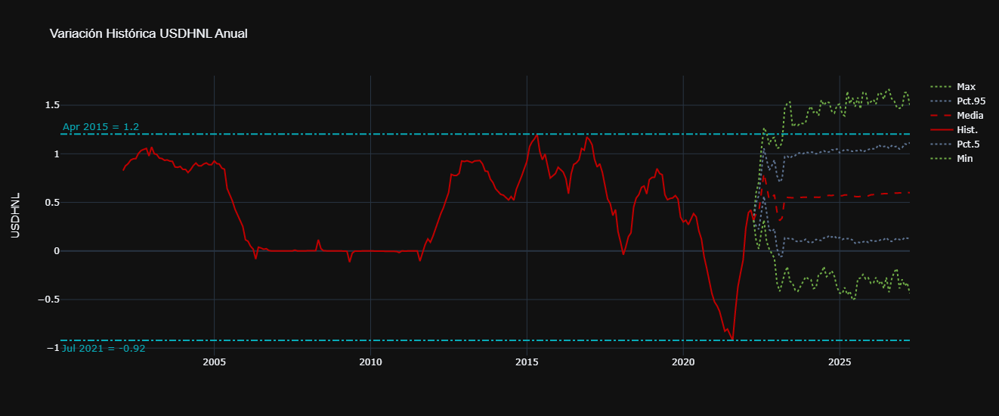

In [66]:
layout_dict['title']['text'] = "Variación Histórica USDHNL Anual"
hnl_gbm.plot_variations(delta_t=12, **layout_dict)

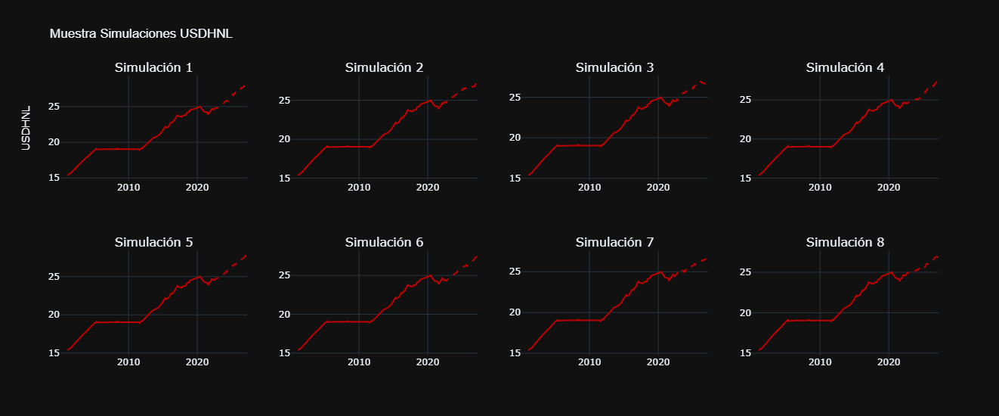

In [67]:
layout_dict['title']['text'] = "Muestra Simulaciones USDHNL"
hnl_gbm.plot_simulations(**layout_dict)

## *Colón (USDCRC)*

In [68]:
crc_series = monthly_rates.loc['2000':, 'COLON/USD']
crc_gbm = stc.GBMRateSeries(crc_series, Np=1000, Nt=60, T=60)

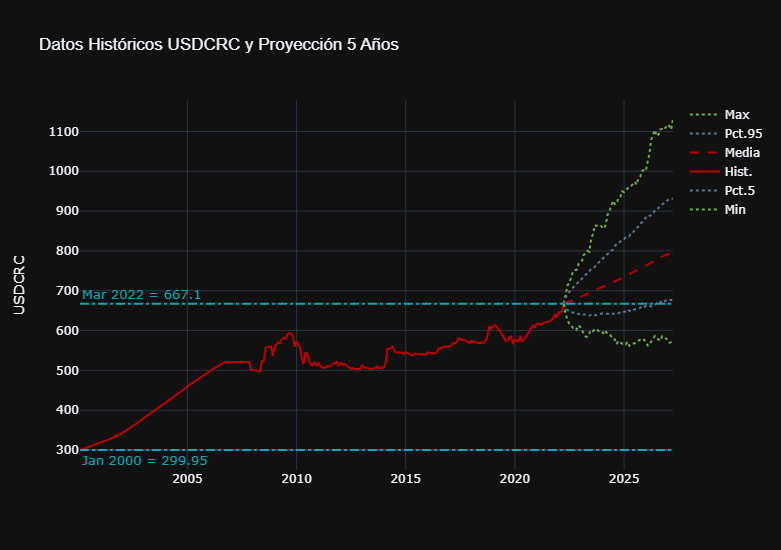

In [69]:
layout_dict['title']['text'] = "Datos Históricos USDCRC y Proyección 5 Años"
layout_dict['yaxis']['title'] = 'USDCRC'
crc_gbm.plot_hist_forecast(**layout_dict)

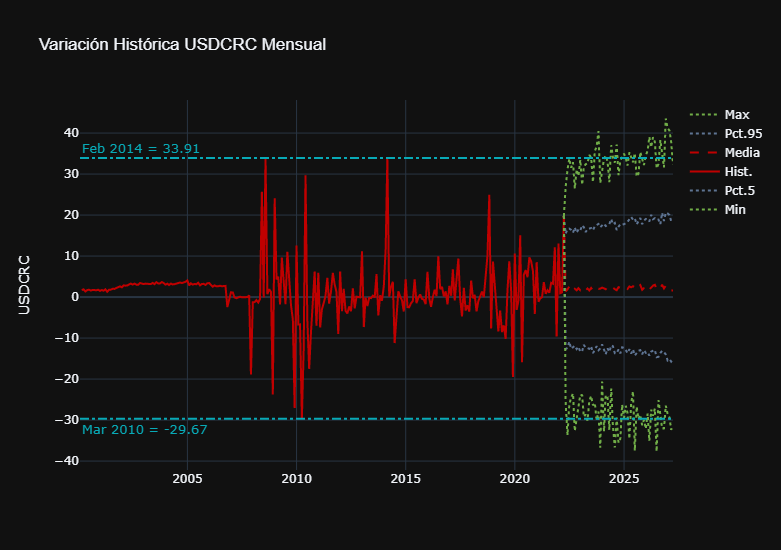

In [70]:
layout_dict['title']['text'] = "Variación Histórica USDCRC Mensual"
crc_gbm.plot_variations(**layout_dict)

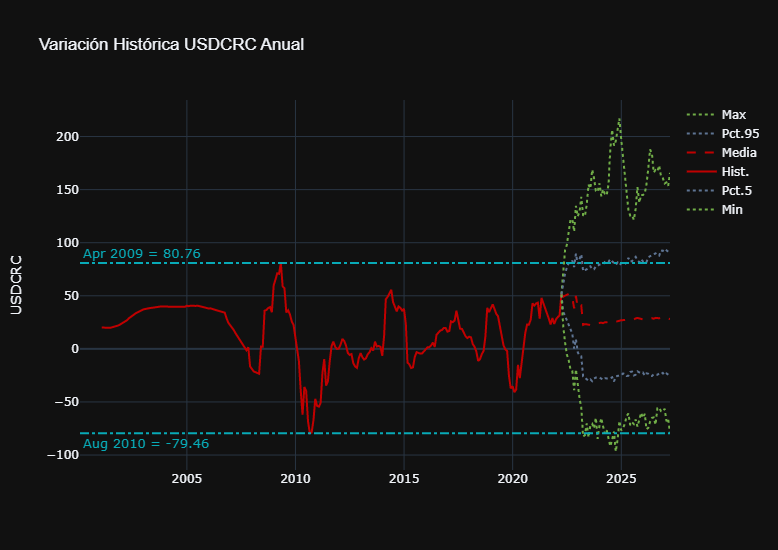

In [71]:
layout_dict['title']['text'] = "Variación Histórica USDCRC Anual"
crc_gbm.plot_variations(delta_t=12, **layout_dict)

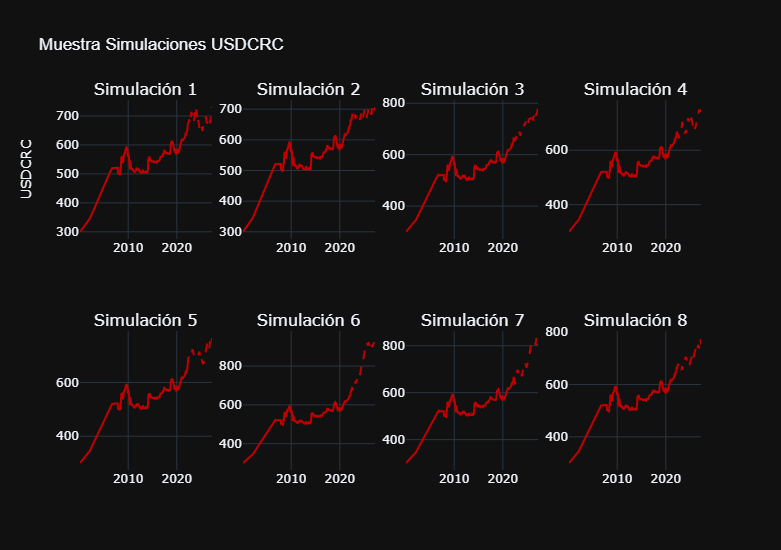

In [72]:
layout_dict['title']['text'] = "Muestra Simulaciones USDCRC"
crc_gbm.plot_simulations(**layout_dict)

## *LIBOR 6M*

In [73]:
libor6m_series = monthly_rates.loc['2000':, 'LIBOR'].dropna()*100
libor6m_gbm = stc.GBMRateSeries(libor6m_series, Np=1000, Nt=60, T=60)

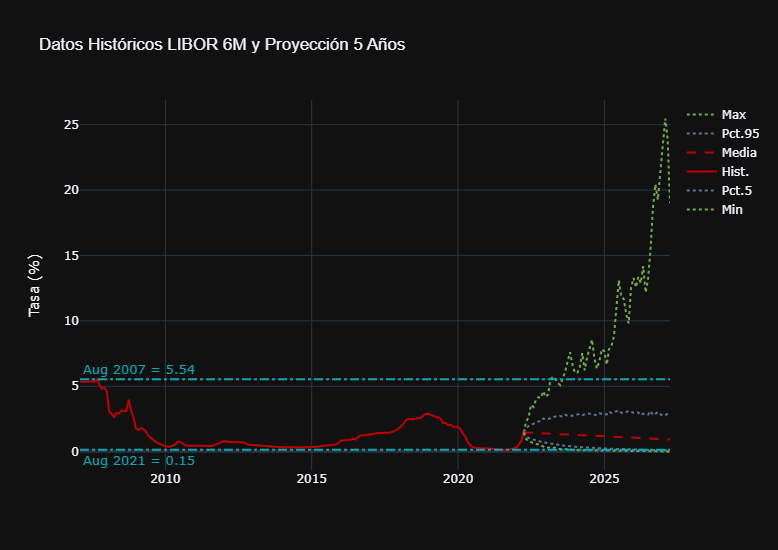

In [74]:
layout_dict['title']['text'] = "Datos Históricos LIBOR 6M y Proyección 5 Años"
layout_dict['yaxis']['title'] = 'Tasa (%)'
libor6m_gbm.plot_hist_forecast(**layout_dict)

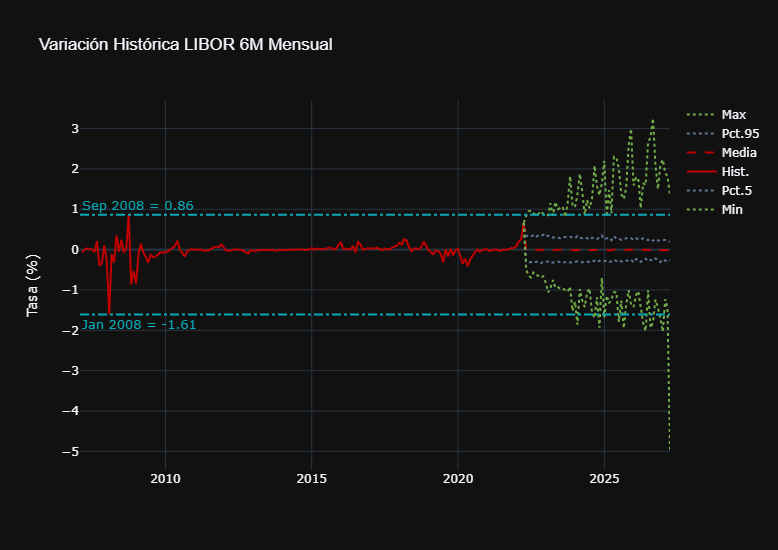

In [75]:
layout_dict['title']['text'] = "Variación Histórica LIBOR 6M Mensual"
libor6m_gbm.plot_variations(**layout_dict)

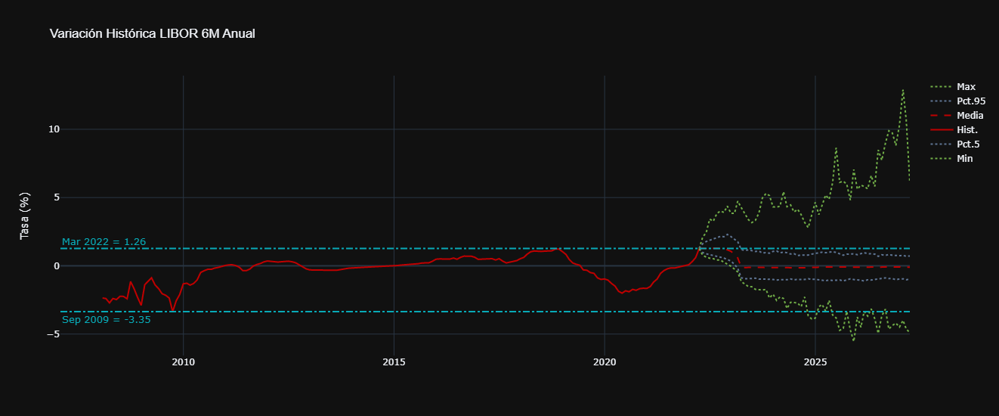

In [76]:
layout_dict['title']['text'] = "Variación Histórica LIBOR 6M Anual"
libor6m_gbm.plot_variations(delta_t=12, **layout_dict)

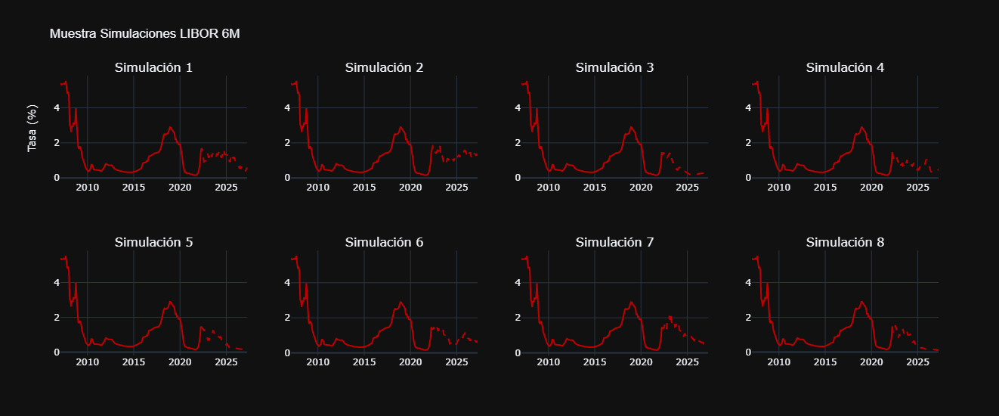

In [77]:
layout_dict['title']['text'] = "Muestra Simulaciones LIBOR 6M"
libor6m_gbm.plot_simulations(**layout_dict)

## *LIBOR 3M*

In [78]:
libor3m_path = '../validation_series/hist_libor.csv'
full_libor_df = pd.read_csv(
    libor3m_path, 
    parse_dates = ['Fecha']
    ).set_index('Fecha', drop=True)
monthly_libor = full_libor_df.groupby(pd.Grouper(freq='M')).last()['LIBOR 3M']
libor3m_gbm = stc.GBMRateSeries(
    series = monthly_libor * 100, 
    Np = 1000,
    Nt = 60,
    T = 60
)

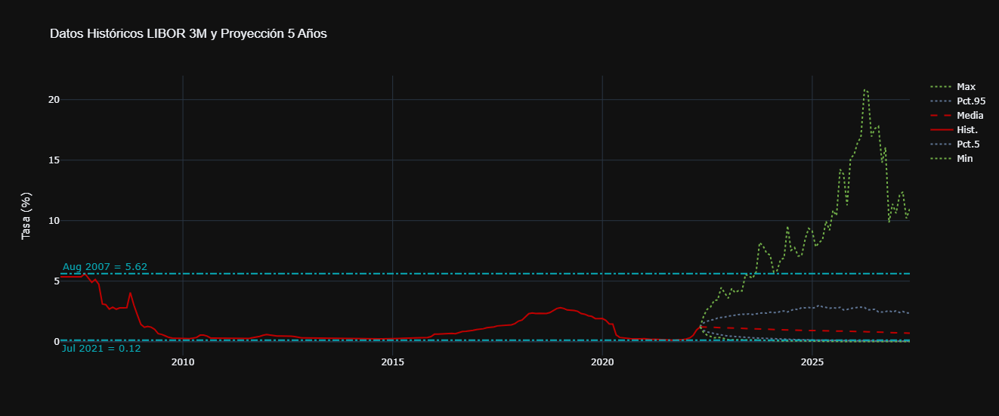

In [79]:
layout_dict['title']['text'] = "Datos Históricos LIBOR 3M y Proyección 5 Años"
libor3m_gbm.plot_hist_forecast(**layout_dict)

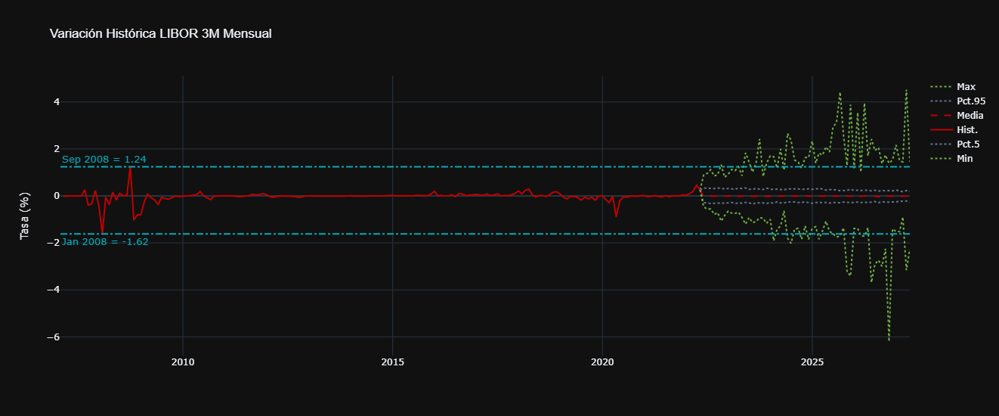

In [80]:
layout_dict['title']['text'] = "Variación Histórica LIBOR 3M Mensual"
libor3m_gbm.plot_variations(**layout_dict)

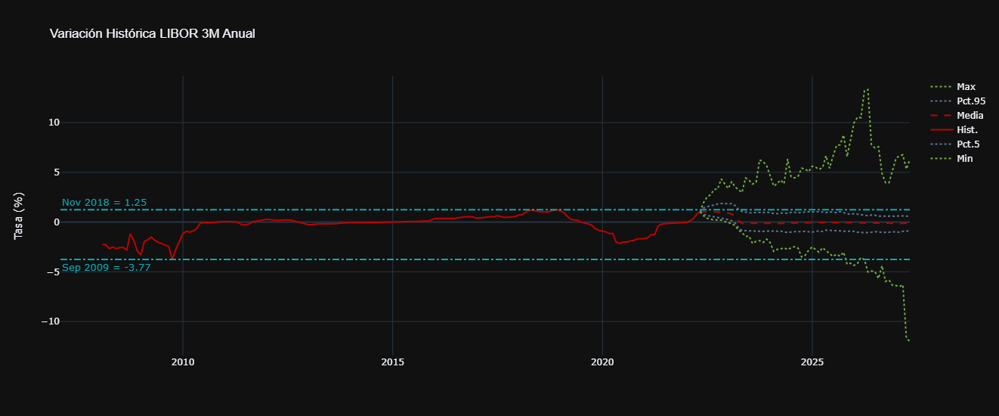

In [81]:
layout_dict['title']['text'] = "Variación Histórica LIBOR 3M Anual"
libor3m_gbm.plot_variations(delta_t=12, **layout_dict)

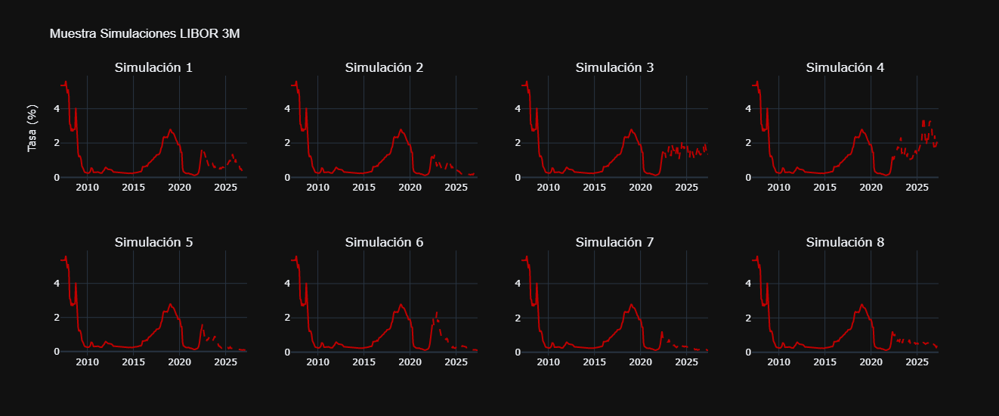

In [82]:
layout_dict['title']['text'] = "Muestra Simulaciones LIBOR 3M"
libor3m_gbm.plot_simulations(**layout_dict)

# Propuesta Modelo SOFR

In [135]:
from fredapi import Fred

In [136]:
fred2 = Fred(stc.FRED_KEY)

In [138]:
# Secured Overnight Financing Rate (SOFR):
sofr_name = 'Secured Overnight Financing Rate'
sofr_df = fred2.get_series('SOFR').to_frame().rename(columns={0:'SOFR'})
sofr_cons_data = pd.read_excel('hist-sofr.xlsx', sheet_name='VWM Rates',
                               skiprows=1, parse_dates=['Date'], usecols='A:D',
                               index_col=0)
sofr_cons_data = (sofr_cons_data[sofr_name]/100).to_frame().rename(
    columns = {sofr_name: 'SOFR'}
)
sofr_df = pd.concat([sofr_cons_data, sofr_df], axis=0)
start_date = datetime.datetime.strftime(
    sofr_df.index.max(),
    '%Y-%m-%d'
)

# Federal Funds Rate (upper limit and effective):
effr_df = fred2.get_series('EFFR').to_frame().rename(columns={0:'EFFR'})
ffr_df = fred2.get_series('DFEDTARU').to_frame().rename(columns={0:'FFR'})

# Personal Consumption Expenditures (PCE Index, and annual growth rate):
pce_index = fred2.get_series('PCEPI').to_frame().rename(columns={0:'PCE'})
pce_df = (pce_index/pce_index.shift(12)-1)*100


# Merge data into one data frame:
df = sofr_df.merge(effr_df, how='outer', left_index=True, right_index=True)
df = df.merge(ffr_df, how='outer', left_index=True, right_index=True)
df = df.merge(pce_df, how='outer', left_index=True, right_index=True)
df = df.fillna(method='ffill').dropna(subset=['SOFR'])
df = df.loc[:fecha_corte, :]
df_monthly = df.groupby(pd.Grouper(freq='M')).last()


In [141]:
df.corr()

,SOFR,EFFR,FFR,PCE
SOFR,1.000000,0.994659,0.994352,-0.052818
EFFR,0.994659,1.000000,0.998984,-0.042299
FFR,0.994352,0.998984,1.000000,-0.033055
PCE,-0.052818,-0.042299,-0.033055,1.000000


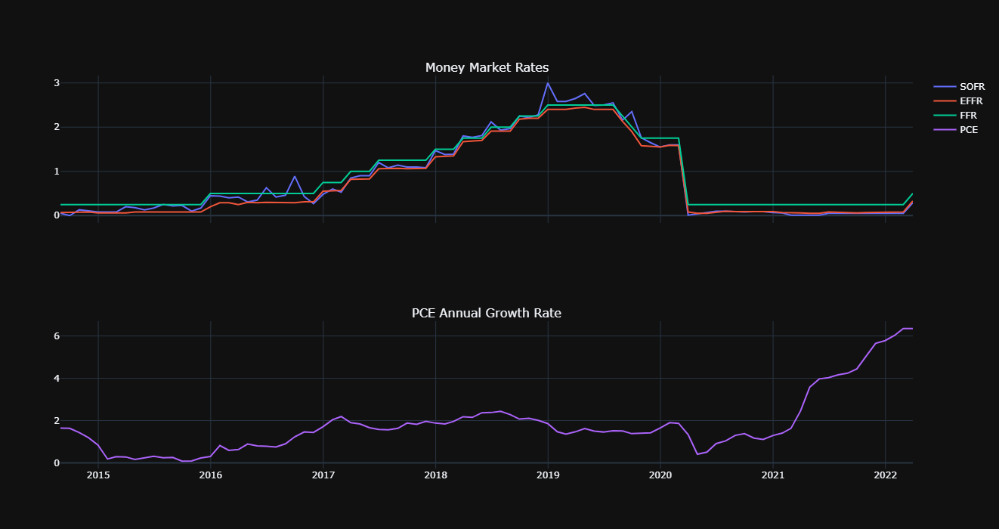

In [142]:
titles = ['Money Market Rates', 'PCE Annual Growth Rate']
fig = make_subplots(rows=2, cols=1, subplot_titles=titles, shared_xaxes=True)
for i, rate in enumerate(df.columns):
    col = 1
    if i < 3:
        row = 1
    else:
        row = 2
    fig.add_trace(
        trace = go.Scatter(
            x = df_monthly.index,
            y = df_monthly[rate].round(2),
            mode = 'lines',
            name = rate
        ),
        row = row,
        col = col
    )
fig.update_layout(template='plotly_dark', height=700)

## 1. ARIMA FFR + Poisson + Diferencia Aleatoria 

In [143]:
hist_ffr = fred('DFEDTAR', start='1982-01-01').read()
hist_ffr_monthly = hist_ffr.groupby(pd.Grouper(freq='M')).last()/100
hist_ffr_monthly = hist_ffr_monthly.iloc[:-1, :].rename(
    columns = {'DFEDTAR': 'FED'}
)
fed_df = monthly_rates['FED'].dropna().to_frame()
fed_df = pd.concat((hist_ffr_monthly, fed_df), axis=0).squeeze()

In [175]:
ffr_poisson = stc.PoissonRateSeries(fed_df, p=2 , q=2, i=0, ref_date='1994-01-01')

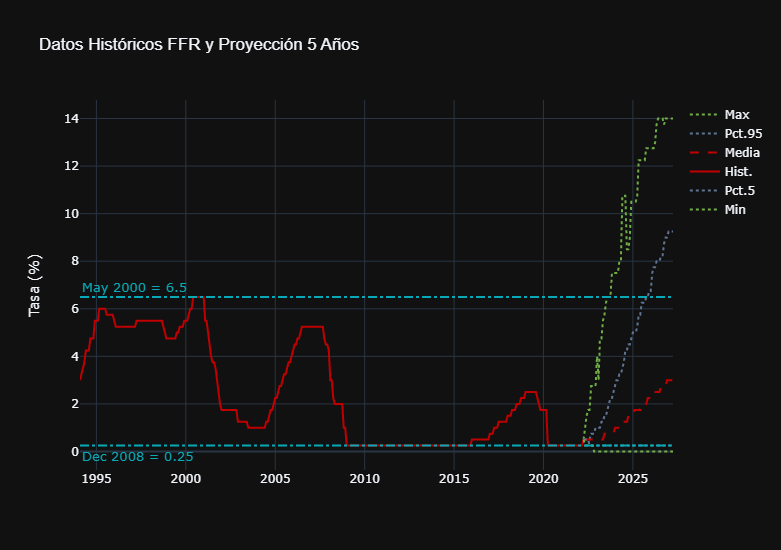

In [176]:
layout_dict['title']['text'] = "Datos Históricos FFR y Proyección 5 Años"
ffr_poisson.plot_hist_forecast(**layout_dict)

In [154]:
sofr_rnd = stc.RandomVariationSeriesSimulation(
    series = df_monthly['SOFR']/100,
    mc_reference_df = ffr_poisson.simulated_df,
    reference_rate_series = df_monthly['FFR']/100,
    variation_type = 'sum'
)

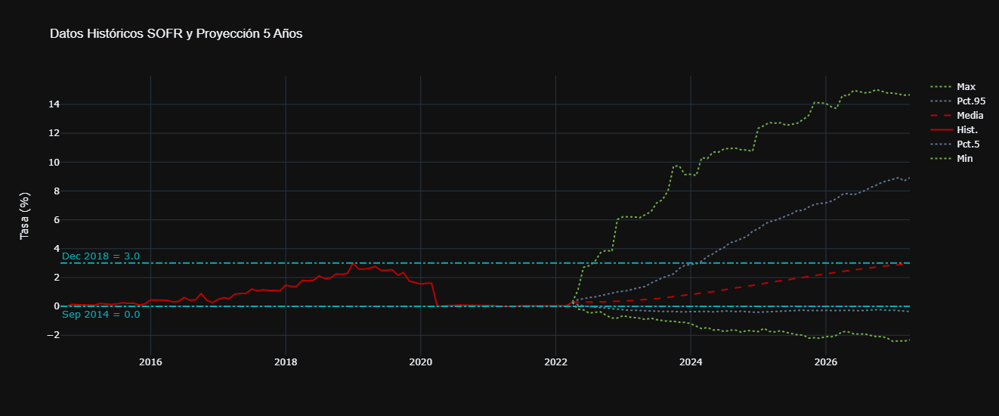

In [155]:
layout_dict['title']['text'] = "Datos Históricos SOFR y Proyección 5 Años"
sofr_rnd.plot_hist_forecast(**layout_dict)

## Modeling

In [197]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

In [222]:
train = fed_df['1994-01-01':'2021-03-01']
test = fed_df['2021-04-01':]
ffr_poisson_m = stc.PoissonRateSeries(train, p=2 , q=2, i=0)
sofr_rnd_m = stc.RandomVariationSeriesSimulation(
    series = df_monthly.loc[: '2021-03-01', 'SOFR']/100,
    mc_reference_df = ffr_poisson_m.simulated_df/100,
    reference_rate_series = df_monthly.loc[:'2021-03-01', 'FFR']/100,
    variation_type = 'sum'
)
y_hat = sofr_rnd_m.simulated_df.mean(axis=1).values[1:13]/100
mean_squared_error(test.values, y_hat, squared=False)

C:\Users\PERSONAL\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



0.0027360279665408246

In [236]:
# Train-test separation:
sofr_df = df_monthly['SOFR'].to_frame()
x_train, y_train, x_test, y_test = stc.series_to_table(
    data = sofr_df.loc[:'2021-03-01'], 
    test_split = 0
)

In [239]:
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV

In [245]:
params_distribs = {
    'max_depth': np.arange(2, 11, 2),
    'learning_rate': [1e-2 * 10 ** (e / 6) for e in range(10)],
    'gamma': [0, 0.25, 1],
    'reg_lambda': [0, 0.1, 1, 3]
}
xgb_sofr = XGBRegressor(use_label_encoder=False, verbosity=0)
rnd_search = RandomizedSearchCV(
    estimator = xgb_sofr,
    param_distributions = params_distribs,
    n_iter = 20,
    cv = 5,
    scoring = 'neg_root_mean_squared_error'
)

In [246]:
rnd_search.fit(x_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, gamma=None,
                                          gpu_id=None, importance_type='gain',
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n...
                                          validate_parameters=None,
                                          verbosity=0),
                   n_iter=20,
                   param_distributio

In [292]:
xgb_final = rnd_search.best_estimator_
sofr_xgb_df = sofr_df.copy()['2020-09-30':'2021-05-01']
next_date = sofr_xgb_df.index[-1]

for _ in range(1, 13):
    x_train, y_train, _, _ = stc.series_to_table(sofr_xgb_df)
    x_train = x_train[-1].reshape(1, -1)
    sofr_xgb_df.loc[next_date, :] = xgb_final.predict(x_train).item()
    next_date = stc.last_day_month(next_date+relativedelta(months=1))

In [293]:
mean_squared_error(test.values, sofr_xgb_df['2021-04-30':].values/100, squared=False)


0.0008685111372690247

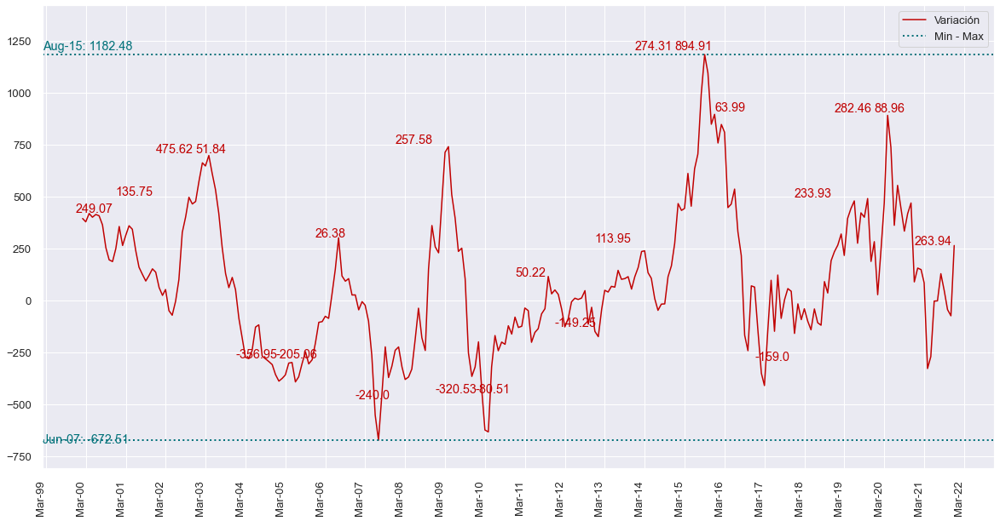

(<Figure size 1440x720 with 1 Axes>, <AxesSubplot:>)

In [41]:
trm_gbm.plot_historic_variation(time_space=12, figsize=(20,10), delta_t=12,
                                upper_space=0.02, lower_space=0.3)

(<Figure size 1440x720 with 1 Axes>, <AxesSubplot:>)

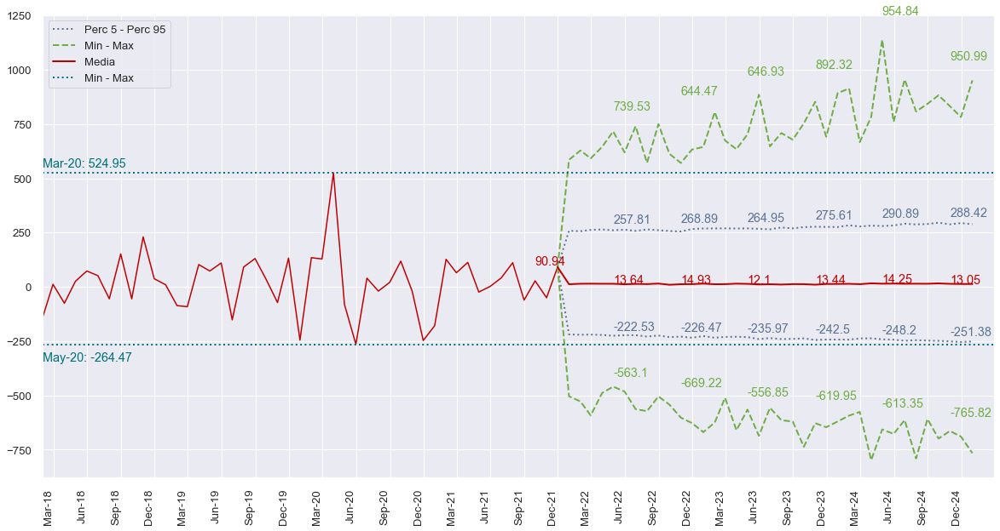

In [42]:
trm_gbm.plot_full_variations('2018-01-01', '2024-12-31', figsize=(20,10), dec=2)

In [56]:
params = model_fit.params
c = params.loc['const', 'IPC Anual']

-0.1892753516111103

In [48]:
params = model_fit.params
params['DTF']

const     -0.317669
L1.TIBR    0.269423
L1.DTF     1.241923
L2.TIBR   -0.201401
L2.DTF    -0.366059
Name: DTF, dtype: float64

In [56]:
model_fit.resid['DTF'].std()

0.044774367764111214

<AxesSubplot:xlabel='Fecha'>

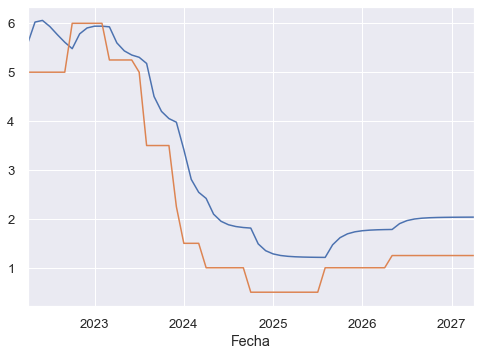

In [26]:
i = np.random.randint(0, 999)
(var_dtf.simulated_df.iloc[:, 0]).plot()
poisson.simulated_df.iloc[:, 0].plot()

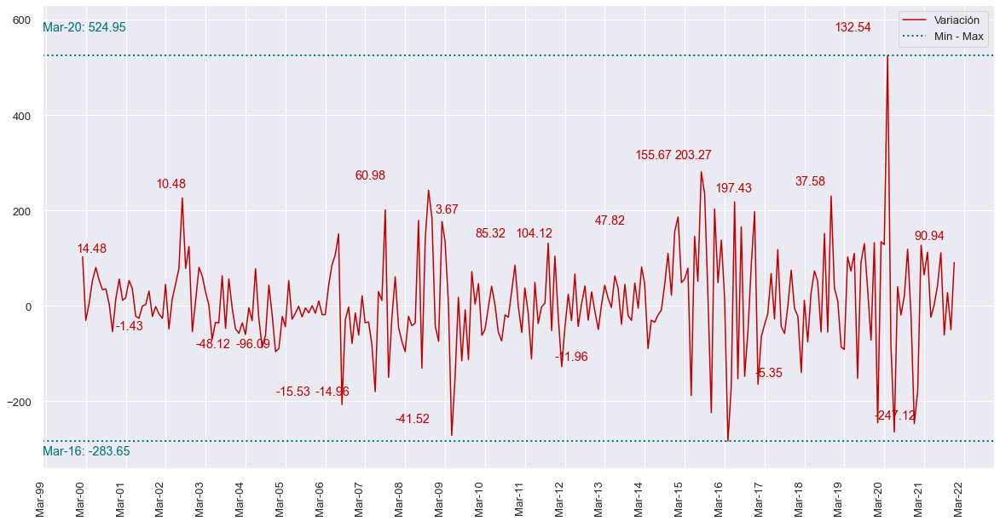

(<Figure size 1440x720 with 1 Axes>, <AxesSubplot:>)

In [40]:
trm_gbm.plot_historic_variation(time_space=12, figsize=(20,10), )

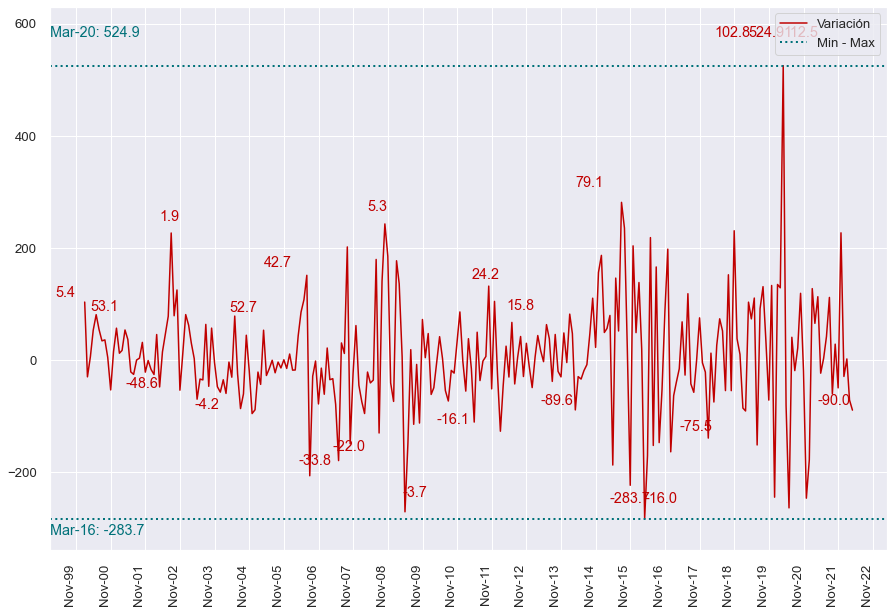

(<Figure size 1080x720 with 1 Axes>, <AxesSubplot:>)

In [44]:
gbm = stc.GBM(100, 0.3, 0.01)
rss = stc.RateSeriesSimulation(trm)
rss.plot_historic_variation(time_space=12, dec=1)

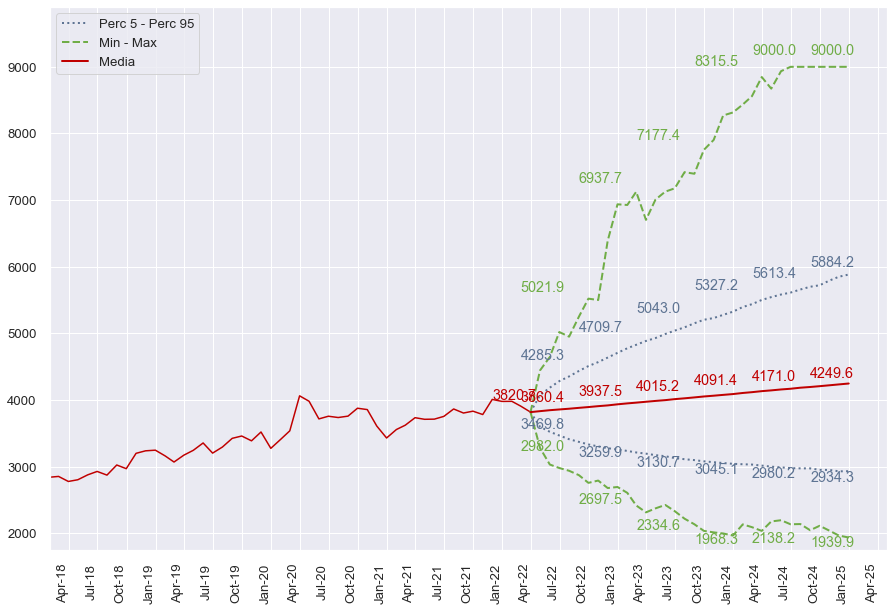

(<Figure size 1080x720 with 1 Axes>, <AxesSubplot:>)

In [45]:
trm_gbm.plot_full_series('2018-01-01','2024-12-31', time_space=4, 
                         upper_space=0.02, lower_space=0.15)

In [29]:
# # VAR Models
# m = np.array([0.15, 1])
# tibr_dtf = monthly_rates[['TIBR', 'DTF']]
# transformed_series = -np.log(m/tibr_dtf-1).dropna()['2008':]
# model = VAR(transformed_series)
# model_fit = model.fit(maxlags=2)
# model_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 17, Apr, 2022
Time:                     20:35:54
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.0921
Nobs:                     170.000    HQIC:                  -11.2017
Log likelihood:           486.068    FPE:                1.26669e-05
AIC:                     -11.2766    Det(Omega_mle):     1.19534e-05
--------------------------------------------------------------------
Results for equation TIBR
             coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------
const          -0.128599         0.176581           -0.728           0.466
L1.TIBR         1.014373         0.078945           12.849           0.000
L1.DTF          0.888273         0.134838            6.588           0.000
L2.TIBR   

In [21]:
!jupyter nbconvert Stochastic-Rates-Modeling.ipynb --no-input --to html --HTMLExporter.theme=dark

[NbConvertApp] Converting notebook Stochastic-Rates-Modeling.ipynb to html
[NbConvertApp] Writing 4243168 bytes to Stochastic-Rates-Modeling.html
